В этом ноутбуке представлена реализация задачи тематического моделирования. Моделирование проводилось с помощью факторного анализа (PCA) для 3 датасетов, которые были получены с помощью парсинга различных сайтов по ключевым словам "компьютер", "продажа". Предполагается, что эти тексты имеют отношение к продаже техники и компьютеров.

Последовательность решения задачи такая:
1. Предобработка текстов (удаление стоп-слов, лемматизация и т.д)
2. Удаление дублирующихся текстов, репостов и очень похожих сообщений
3. Создание эмбеддингов текстов, добавление в FAISS
4. Извлечение из FAISS текстов, самых релевантных запросу
5. Создание TF-IDF эмбеддингов
6. Проведение PCA
7. Отбор самых релевантных для каждого фактора сообщений
8. Определение темы набора сообщений (для каждого фактора)

В самом последнем блоке "Объединенный датасет" демонстрируется устойчивость разработанного решения - 3 датасета, которые анализировались по отдельности, объединяются в один.

При этом темы, которые были выделены в маленьких датасетах, также должны быть найдены и в большом датасете, что и получилось :)

#Импорты

In [ ]:
import warnings
# Подавление предупреждений
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q faiss-cpu tiktoken
!pip install -q openai==0.28.1
!pip install -q langchain==0.0.330
!pip install -q pymorphy3
!pip install -q factor_analyzer



import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
import regex as re
from nltk.tokenize import sent_tokenize
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from factor_analyzer import Rotator
from sklearn.decomposition import KernelPCA
from wordcloud import WordCloud
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import ward, fcluster
from langchain.embeddings.openai import OpenAIEmbeddings
from langchain.text_splitter import MarkdownHeaderTextSplitter
from langchain.vectorstores import FAISS
from langchain.document_loaders import TextLoader
import os
import getpass
import re
import requests
import openai
import tiktoken
from langchain.docstore.document import Document
from pymorphy3 import MorphAnalyzer
from wordcloud import WordCloud
nltk.download('stopwords')
nltk.download('punkt')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.0/27.0 MB 56.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.0/77.0 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 41.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
# Получение ключа API от пользователя и установка его как переменной окружения
openai_key = getpass.getpass("OpenAI API Key:")
os.environ["OPENAI_API_KEY"] = openai_key
openai.api_key = openai_key

OpenAI API Key:··········


# Класс TopicModeler

## Реализация класса

In [ ]:
class TopicModeler:

    def __init__(self, df, sw, preprocessed=pd.DataFrame()):
      self.initial_df = df

      self.sw = sw
      self.sw.extend(stopwords.words('english'))

      self.initial_preprocessed = preprocessed # предобработанный initial_df

      self.clustered_df = [] # df с колонкой ['cluster'] (для очистки от похожих)
      self.faiss_results = []
      self.__db = []
      self.__linkage_matrix = [] # матрица косинусной близости
      self.for_analysis = [] # очищенный от мусора датафрейм

      self.preprocessed = pd.DataFrame() # предобработанный for_analysis
      self.embeddings = []
      self.embs_and_text = pd.DataFrame() # датафрейм с эмбеддингами и текстами


      self.hold_dict = {
          'sigmoid+': 0.03,
          'sigmoid-': -0.03,
          'rbf+': 0.05,
          'rbf-': -0.05,
          'cosine+': 0.4,
          'cosine-': -0.4
      }


    def __drop_hash(self, x):
      """ Удаляет хэштеги и ссылки
      Args:
        x: строка
      Returns:
        str: очищенная строка
      """
      return ' '.join(re.sub(r'https?://\S+|#\w+', '', x).split())


    def __keep_only(self, row, sign):
      """
      Оставляет в строке dataframe только максимальное или минимальное значение
      """
      if sign == 'max':
        value = row.max()
      else:
        value = row.min()
      return [val if val == value else 0 for val in row]


    def __preprocess_each_str(self, x):
      """
      Выкидываем все, кроме букв, приводим в начальную форму (и нижний регистр)
      """
      x = self.__drop_hash(x)
      parser = MorphAnalyzer()
      tokens = word_tokenize((re.sub("[^А-яa-zA-Zё]", ' ', x)))
      return ' '.join(parser.parse(word)[0].normal_form for word in tokens if parser.parse(word)[0].normal_form not in self.sw)

    def __get_first_n_tokens(self, text, n=512):
      """
      Получаем первые n токенов из строки text
      """
      # Создаем токенизатор для модели text-embedding-ada-002
      encoding = tiktoken.encoding_for_model("text-embedding-ada-002")
      tokens = encoding.encode(text) # Преобразуем текст в токены
      truncated_tokens = tokens[:n] # Извлекаем первые n токенов
      truncated_text = encoding.decode(truncated_tokens) # Преобразуем токены обратно в текст

      return truncated_text


    def __get_chunks(self, text, tokens):
      """
      Получаем чанки размером tokens токенов в формате для FAISS
      """
      docs = []
      for i in text:
        docs.append(Document(page_content=self.__get_first_n_tokens(i, tokens)))
      return docs


    def __print_text(self, share, topic, full, symbols, sign):
      """
      Печатает заданный процент сообщений с самыми большими значениями фактора
      Args:
          share: доля текстов, который хотим посмотреть
          topic: номер топика
          full: True, если вывести сообщение полностью, default = False
          symbols: количество символов сообщения для вывода, если full=False, default=200
          sign: с какой "стороны" смотрим фактор, default='+'
      """
      # проверка, что все нули (нет сообщений в теме)
      if (self.final[f'f{topic}'] == 0).all():
        print()
      else:
        if share == 1:
          docs = self.final[self.final[f'f{topic}'] != 0]['Сообщение']
        else:
          if sign=='-':
            proc = share
          else:
            proc = 1 - share

          threshold = sorted(self.final[self.final[f'f{topic}']!=0][f'f{topic}'])[int(sum(self.final[f'f{topic}']!=0)*proc)]
          if sign=='-':
            docs = self.final[self.final[f'f{topic}'] < threshold]['Сообщение']
          else:
            docs = self.final[self.final[f'f{topic}'] > threshold]['Сообщение']

        for i in docs:
          if full:
            print(i)
          else:
            print(i[:symbols])
          print('--'*30)




        if self.gpt:

          texts = list(docs.apply(lambda x: x[:300]))

          result = openai.ChatCompletion.create(
          model="gpt-3.5-turbo",
          messages=[
              {"role": "system", "content": "Нужно объединить тексты в одну тему. Тема должна быть сформулирована коротко и максимально конкретно"},
                {"role": "user", "content": f"Назови общую тему этих текстов {texts}"}
            ]
        )

          print(f"Chat GPT считает, что это тема\n {result['choices'][0]['message']['content']}")

        print('Количество сообщений в теме: ', sum(self.final[f'f{topic}'].value_counts()) - self.final[f'f{topic}'].value_counts()[0], '\n')


    def drop_similar_messages(self, similarity_threshold=1.5):
      """
      Удаляет тексты, которые мало отличаются друг от друга
      (часто репосты или плагиат)

      Returns:
        DataFrame: уникальные записи
        DataFrame: df с колонкой ['cluster']
      """

      print(f"Количество текстов: {len(self.initial_df)}\n")

      # если не задан preprocessed
      if (len(self.initial_preprocessed) == 0):
        print("Предобработанный корпус не задан\nПредобработка...")
        self.initial_preprocessed = self.initial_df['Сообщение'].apply(self.__preprocess_each_str).to_frame()

      unique_indexes = list(self.initial_preprocessed['Сообщение'].drop_duplicates().reset_index()['index'])
      self.clustered_df = self.initial_df.loc[unique_indexes].reset_index()['Сообщение'].copy().to_frame()


      print(f"Количество текстов без полных дубликатов: {len(self.clustered_df)}\n")

      self.clustered_df = self.clustered_df['Сообщение'].apply(self.__drop_hash).to_frame()
      self.clustered_df = self.clustered_df[self.clustered_df['Сообщение'].apply(lambda x: len(x) > 50)]
      if len(self.__linkage_matrix) == 0:
          # Преобразование текста в вектора с использованием TF-IDF, передаем список стоп-слов
          vectorizer = TfidfVectorizer(stop_words=self.sw)
          X = vectorizer.fit_transform(self.clustered_df['Сообщение'])

          # Вычисление матрицы косинусного сходства
          cosine_sim = cosine_similarity(X)

          # Применение иерархической кластеризации
          self.__linkage_matrix = ward(cosine_sim)

      # Определение кластеров с порогом (например, 1.5) для определения "похожих" строк
      # Можно настроить порог, чтобы контролировать, насколько похожи строки должны быть, чтобы считаться в одном кластере
      clusters = fcluster(self.__linkage_matrix, similarity_threshold, criterion='distance')
      # Добавление информации о кластерах в исходный DataFrame
      self.clustered_df.loc[:, 'cluster'] = clusters


      # Удаление дубликатов, оставляя по одному представителю от каждого кластера
      # Здесь предполагается, что "первый" элемент в каждом кластере является представителем
      self.__uni = self.clustered_df.drop_duplicates(subset='cluster').copy()
      self.__uni.drop('cluster', axis=1, inplace=True)
      self.__uni = self.__uni.reset_index().drop(columns=['index'])

      print(f"Количество текстов после удаления похожих: {len(self.__uni)}\n")

      # Теперь uni содержит только уникальные строки с точки зрения кластеризации


    def faiss_query(self, query, reinit_db = False, tokens=512, plot = False):
      """ Запрос к FAISS
      Args:
        query: текст запроса
        reinit_db: создавать новую БЗ (если изменился датафрейм)
        tokens: размер чанков для добавления в БЗ
        plot: отрисовка распределения скоров, default = False
      Returns:
        tuple: (текст, скор)
        list: [все скоры]
      """


      if self.__db == [] or reinit_db:
          # База знаний, которая будет подаваться в langChain
          source_chunks=self.__get_chunks(self.__uni['Сообщение'], tokens)

          # Инициализирум модель эмбеддингов
          embeddings = OpenAIEmbeddings()

          print("Создание эмбеддингов, добавление в базу...")

          # Создадим индексную базу из разделенных фрагментов текста
          self.__db = FAISS.from_documents(source_chunks, embeddings)


      # получаем для каждого текста его similarity score к запросу (1 - самые релевантные)
      self.faiss_results = self.__db.similarity_search_with_relevance_scores(query, len(self.__uni))

      if plot:
        # строим распрделение значений similarity score
        sns.set(style="whitegrid", context="talk")
        plt.figure(figsize=(6, 4))
        scores = [sublist[1] for sublist in self.faiss_results]
        sns.histplot(scores, bins=20, color='green', kde=True)

        # Добавление заголовка и меток осей
        plt.title(f'Similarity score, {query}', fontsize=15)
        plt.xlabel('Score', fontsize=14)
        plt.ylabel('Частота', fontsize=14)

        # Увеличение шрифта для меток осей
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Отображение графика
        plt.show()
      #return results, scores

    def get_most_relevant(self, top_texts_share=0.4):
      """ Возвращает указанную долю самых релевантных текстов
      Args:
        top_texts_share: доля самых релевантных текстов (больше всего similarity score)
      """
      scores = [sublist[1] for sublist in self.faiss_results]
      relevance_threshold = np.percentile(scores, 100-top_texts_share*100)
      filtered_texts = [element[0].page_content for element in self.faiss_results if element[1] > relevance_threshold]
      print(f"Количество релевантных текстов: {len(filtered_texts)}\n")


      self.for_analysis = pd.DataFrame({'Сообщение': filtered_texts})





    def vectorize_text(self, top_words_percentage=0.25, min_df=0.01, max_df=0.7, truncated_n=30, reinit=False):
      """ Выполняет векторизацию текстов для PCA (TF-IDF)
      Args:
        top_words_percentage: сколько процентов самых частых слов возьмем (доля), default = 0.25
        min_df: в скольких минимум документах должно быть слово, default = 0.01
        max_df: в какой доле документов максимум должно быть слово, default = 0.7

        reinit: если изменился датафрейм, то True (чтобы переделать preprocessed)

      """

      if len(self.preprocessed) == 0 or reinit:
        print("Предобработка текстов...\n")
        self.preprocessed = self.for_analysis['Сообщение'].apply(self.__preprocess_each_str)

      all_words = ' '.join(self.preprocessed).split(' ')
      uni_words = np.unique(all_words)

      print(f"Всего уникальных слов: {len(uni_words)}\n Из них берем максимум {top_words_percentage*100} процентов")

      print("TF-IDF...")
      #Преобразование текстов в TF-IDF векторы
      self.vectorizer = TfidfVectorizer(max_features=int(len(uni_words)*top_words_percentage), min_df=min_df, max_df=max_df)
      tfidf_matrix = self.vectorizer.fit_transform(self.preprocessed)


      #Применение TruncatedSVD (PCA для разреженных матриц) - подготовка для PCA
      svd = TruncatedSVD(n_components=truncated_n)
      self.embeddings = svd.fit_transform(tfidf_matrix)



    def perform_pca(self, n_components, rotated = True, kernel_type = 'linear', rotation_type='varimax'):
      """ Выполняет PCA
      Args:
        n_components: число компонент для анализа
        rotated: использовать ли поворот после PCA, default = True

        kernel_type: тип ядра, default='linear' (фактически обыковенный PCA)
        rotation_type: тип вращения, default=varimax

      Returns:
        tfidf_vectorizer
        tfidf-матрица
        list: предобработанные документы

      """
      self.kernel_type = kernel_type


      if self.kernel_type=='linear':
        self.kernel = False
      else:
        self.kernel = True
      self.n_components = n_components
      if self.kernel:
        self.__pca = KernelPCA(n_components=n_components, kernel = kernel_type)
        X_pca = self.__pca.fit_transform(self.embeddings) # Координаты векторов в новом пространстве признаков
      else:
        self.__pca = PCA(n_components=n_components)
        X_pca = self.__pca.fit_transform(self.embeddings) # Координаты векторов в новом пространстве признаков


      if rotated == True:
        rotator = Rotator(method=rotation_type, normalize=True)
        #The value for `method` must be one of the following: varimax, oblimax, quartimax, equamax, geomin_ort, promax, oblimin, quartimin, geomin_obl.
        rotated_pca = rotator.fit_transform(X_pca) # ортогональное преобразование для повышение интерпретируемости
        rotated_pca = pd.DataFrame(rotated_pca, columns=[f'f{i+1}' for i in range(n_components)])
        rotated_pca['Сообщение'] = self.for_analysis['Сообщение']
        self.embs_and_text = rotated_pca.copy()
      else:
        pca_df = pd.DataFrame(X_pca, columns=[f'f{i+1}' for i in range(n_components)]) # тут координаты каждого вектора (эмбеддинга) в новом пространстве
        pca_df['Сообщение'] = self.for_analysis['Сообщение']
        self.embs_and_text = pca_df.copy()



    def scree_plot(self):
        # Проверяем, определен ли атрибут self.kernel
        try:
            if self.kernel:
                print('Для KernelPCA невозможно посчитать долю объясненной дисперсии')
            else:
                explained_variance = self.__pca.explained_variance_ratio_
                cumulative_variance = np.cumsum(explained_variance)
                plt.figure(figsize=(9, 5))
                plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
                plt.xlabel('Номер компоненты')
                plt.ylabel('Доля объясненной дисперсии')
                plt.title('Scree Plot')
                plt.show()
                print("Кумулятивная объясненная дисперсия:", cumulative_variance[-1])
        except AttributeError as e:
            raise AttributeError("График объясненной дисперсии можно построить только после проведения PCA!") from e



    # def scree_plot(self):
    #   if self.kernel:
    #     print('Для KernelPCA невозможно посчитать долю объясненной дисперсии')
    #   else:
    #     explained_variance = self.__pca.explained_variance_ratio_
    #     cumulative_variance = np.cumsum(explained_variance)
    #     plt.figure(figsize=(9, 5))
    #     plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
    #     plt.xlabel('Номер компоненты')
    #     plt.ylabel('Доля объясненной дисперсии')
    #     plt.title('Scree Plot')
    #     plt.show()
    #     print("Кумулятивная объясненная дисперсия:", cumulative_variance[-1])



    def factors_plot(self):
      for i in range(1, self.n_components+1):
        plt.figure(figsize=(5, 3))
        sns.histplot(self.embs_and_text[f'f{i}'], bins=15, color='green', kde=True)

        # Добавление заголовка и меток осей
        plt.title(f'Распределение значений фактора {i}', fontsize=18)
        plt.xlabel('Значения фактора', fontsize=14)
        plt.ylabel('Частота', fontsize=14)

        # Увеличение шрифта для меток осей
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Отображение графика
        plt.show()



    def print_topic(self, hold=0, wordcloud=True, share = 1, sign='+', gpt=False, full=False, symbols = 200, min_message_count=10):
      self.gpt = gpt
      """ Выделяет релевантные тексты и ключевые слова
      Args:
        hold: трешхолд для отсечения самых релевантных текстов - абсолютное значение (можно посмотреть по графику)
        wordcloud: строить ли облако слов, default = True
        share: доля выводимых текстов, default=1
        sign: с какой "стороны" смотрим фактор, default='+'
        gpt: хочу ли, чтобы gpt обозвал как-то эту тему, default=False
        full: выводить сообщение полностью, default=False
        symbols: сколько символов сообщения выводить, default=200
        min_message_count: сколько сообщений должно быть в теме

      """


      if hold == 0:
        hold = self.hold_dict[self.kernel_type+sign]


      # Зануляем значения меньше (или больше) трешхолда
      new_df = self.embs_and_text.copy()
      if sign == '-':
        new_df[new_df.select_dtypes(include=['number']).columns] = new_df.select_dtypes(include=['number']).applymap(lambda x: 0 if x > hold else x)
      else:
        new_df[new_df.select_dtypes(include=['number']).columns] = new_df.select_dtypes(include=['number']).applymap(lambda x: 0 if x < hold else x)

      # Оставляем только строки, в которых хотя бы одно ненулевое значение
      numeric_cols = new_df.select_dtypes(include=['number']).columns
      non_zero_rows = new_df[new_df[numeric_cols].any(axis=1)]
      #print("Количество сообщений с явно выраженной темой: ", len(non_zero_rows))

      # Оставляем только МАКСИМАЛЬНЫЕ или МИНИМАЛЬНЫЕ значения в строках
      # Получаем, какому топику сообщение наиболее релевантно

      if sign == '-':
        non_zero_rows.loc[:, numeric_cols] = non_zero_rows[numeric_cols].apply(lambda row: pd.Series(self.__keep_only(row, 'min'), index=numeric_cols), axis=1)
      else:
        non_zero_rows.loc[:, numeric_cols] = non_zero_rows[numeric_cols].apply(lambda row: pd.Series(self.__keep_only(row, 'max'), index=numeric_cols), axis=1)



      self.final = non_zero_rows.copy()
      all_messages_count = 0



      if wordcloud:

        # Датафрейм для облака слов
        for_cloud = non_zero_rows.copy()
        for_cloud['Сообщение'] = self.preprocessed[self.final.index].apply(lambda x: ' '.join(set(x.split()) & set(self.vectorizer.get_feature_names_out())))

        # Количество подграфиков (равно количеству итераций)
        n_rows = self.n_components
        n_cols = 1



        for i in range(1, n_rows + 1):
            # Создание строки для облака слов
            long_string = ','.join(for_cloud[for_cloud[f'f{i}'] != 0]['Сообщение'].values)
            #long_string = ','.join(for_cloud[for_cloud[f'f{i}'] != 0]['Сообщение'].apply(self.__preprocess_each_str).values)
            count = sum(for_cloud[f'f{i}'] != 0)

            if long_string != '' and count >= min_message_count :
              all_messages_count += count

              # Генерация облака слов
              plt.figure(figsize=(6, 6))  # Размер окна графика
              wordcloud = WordCloud(
                  width=1200,
                  height=1000,
                  background_color="white",
                  max_words=200,
                  contour_width=3,
                  contour_color='steelblue',
                  colormap='viridis'  # Цветовая карта для лучшего визуального эффекта
              ).generate(long_string)

              plt.imshow(wordcloud, interpolation='bilinear')
              plt.title(f'Облако слов для темы {i}', fontsize=20)
              plt.axis('off')  # Убираем оси

              # Отображение графика
              plt.show()

              print('#'*5, f"КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ {i} ", '#'*5, '\n\n')

              self.__print_text(share, i, full, symbols, sign)

              print('\n\n')

            else:
              plt.figure(figsize=(6, 6))
              plt.text(0.5, 0.5, f'Фактор {i} не информативен', fontsize=20, ha='center', va='center')
              plt.title(f'Облако слов для темы {i}', fontsize=20)
              plt.axis('off')
              plt.show()

            print('\n\n')


        plt.show()


      else:
        for i in range(1, n_rows + 1):

            count = sum(self.final[f'f{i}'] != 0)

            if count >= min_message_count:
              all_messages_count += count


              print('\n\n')
              print('#'*5, f"КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ {i} ", '#'*5, '\n\n')

              self.__print_text(share, i, full, symbols, sign)
            else:

              print('#'*5, f"ФАКТОР {i} НЕИНФОРМАТИВЕН", '#'*5, '\n\n')

            print('\n\n')



      # ИТОГ
      print('*'*30, "ИТОГ", '*'*30, '\n')
      print("Количество классифицированных сообщений: ", all_messages_count, '\n')
      for i in range(1, self.n_components+1):
        count = sum(self.final[f'f{i}'] != 0)
        if count >= min_message_count:
          print(f"Количество сообщений для темы {i}: {sum(self.final[f'f{i}']!=0)}")
        else:
          print(f"Количество сообщений для темы {i}: 0")


In [ ]:
sw_ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/stopwords.txt')
sw_ = list(sw_.c)

# Ядро sigmoid

## Исследование comps (10000)

In [ ]:
df_ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/computers.csv', sep=';', on_bad_lines='skip')

In [ ]:
preprocessed_ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/modified.csv')

In [ ]:
modeler = TopicModeler(df_['Сообщение'].to_frame(), sw_, preprocessed_)

In [ ]:
%%time
modeler.drop_similar_messages(1)

Количество текстов: 10874

Количество текстов без полных дубликатов: 8503

Количество текстов после удаления похожих: 6016

CPU times: user 3min 13s, sys: 1.62 s, total: 3min 14s
Wall time: 3min 16s


In [ ]:
modeler.clustered_df.value_counts('cluster')

cluster
868     33
10      17
1935    15
888     14
887     14
        ..
2270     1
2269     1
2268     1
2267     1
6016     1
Name: count, Length: 6016, dtype: int64

In [ ]:
#modeler.clustered_df[modeler.clustered_df['cluster']==888]['Сообщение']

Создание эмбеддингов, добавление в базу...


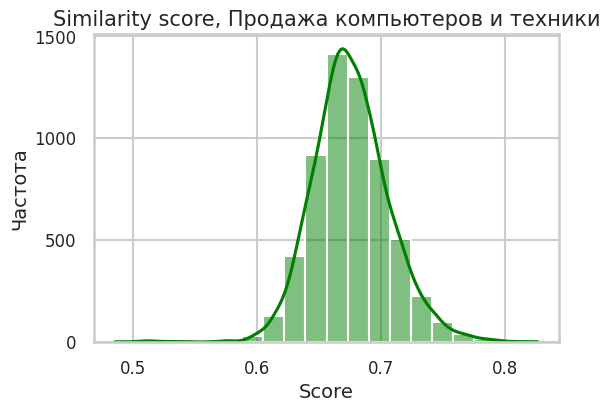

In [ ]:
modeler.faiss_query('Продажа компьютеров и техники', plot=True)

In [ ]:
modeler.get_most_relevant(0.1)

Количество релевантных текстов: 602



In [ ]:
modeler.for_analysis

,Сообщение
0,Оценка: 5 из 5 Считается одним из крупных мага...
1,"Оценка 4 из 5. Неплохой ассортимент техники, к..."
2,Постоянным клиентам доступны специальные цены....
3,Настоящая компьютерная лихорадка началась в те...
4,В Омске как раз есть три предложения по продаж...
...,...
597,Обзор коллекции моих компьютерных игр (часть 1...
598,Московский предпринимательский форум 2024 - 21...
599,Сегодня я в гостях в новой мастерской Викона. ...
600,"Коматус,Мэнтис и мини мастер Самодельные погру..."


In [ ]:
%%time
modeler.vectorize_text(reinit=True)

Предобработка текстов...

Всего уникальных слов: 8112
 Из них берем максимум 25.0 процентов
TF-IDF...
CPU times: user 1min 23s, sys: 5.9 s, total: 1min 29s
Wall time: 1min 30s


In [ ]:
modeler.perform_pca(10, kernel_type='sigmoid')

In [ ]:
modeler.embs_and_text

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,Сообщение
0,-0.017284,0.011838,0.006052,-0.004546,-0.028651,-0.014587,0.027912,0.012881,0.019661,0.012348,Оценка: 5 из 5 Считается одним из крупных мага...
1,-0.009491,0.003229,0.007537,-0.003039,-0.033307,-0.010726,0.001790,0.020657,0.005593,0.014411,"Оценка 4 из 5. Неплохой ассортимент техники, к..."
2,-0.020383,0.006434,-0.006326,-0.006418,-0.003527,-0.008495,0.003382,-0.000178,0.002101,0.018800,Постоянным клиентам доступны специальные цены....
3,0.006287,0.028040,0.007952,-0.001034,0.000760,0.009496,0.017581,-0.001505,-0.004941,0.026104,Настоящая компьютерная лихорадка началась в те...
4,-0.006419,0.000271,-0.011715,0.026960,-0.009577,-0.006513,-0.006089,-0.006449,-0.007203,0.010280,В Омске как раз есть три предложения по продаж...
...,...,...,...,...,...,...,...,...,...,...,...
597,0.009168,0.004291,0.016615,0.002030,0.012026,0.004420,-0.007974,-0.009570,0.021368,0.013718,Обзор коллекции моих компьютерных игр (часть 1...
598,0.005436,0.001576,-0.000091,0.003470,-0.000830,0.000963,-0.003813,0.000905,0.001488,-0.008622,Московский предпринимательский форум 2024 - 21...
599,0.016783,-0.000813,-0.007520,0.004053,-0.000504,0.004627,0.008671,0.007591,0.008127,0.009211,Сегодня я в гостях в новой мастерской Викона. ...
600,0.002643,0.002581,-0.005398,0.002151,-0.003205,0.003643,-0.002838,0.002069,0.004587,-0.004956,"Коматус,Мэнтис и мини мастер Самодельные погру..."


In [ ]:
modeler.scree_plot()

Для KernelPCA невозможно посчитать долю объясненной дисперсии


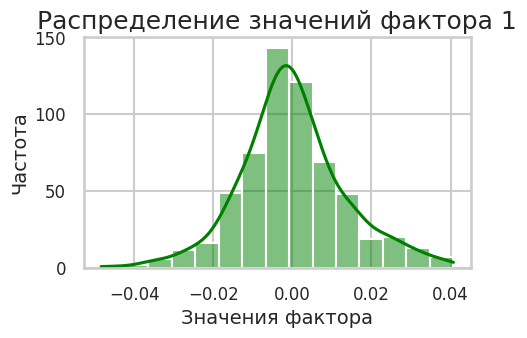

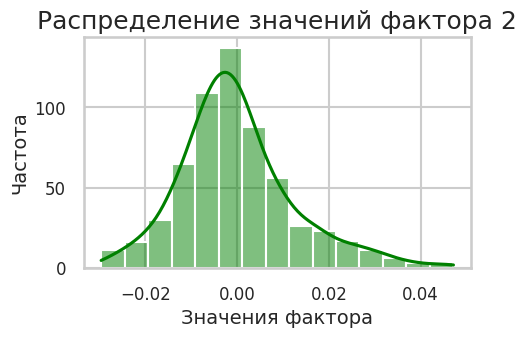

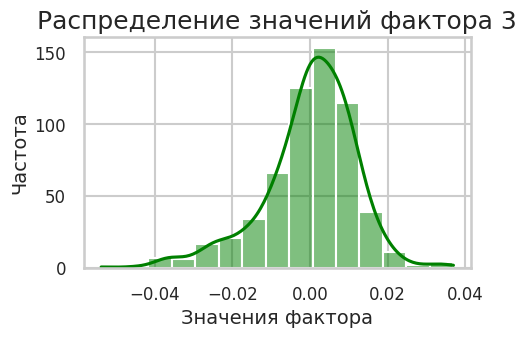

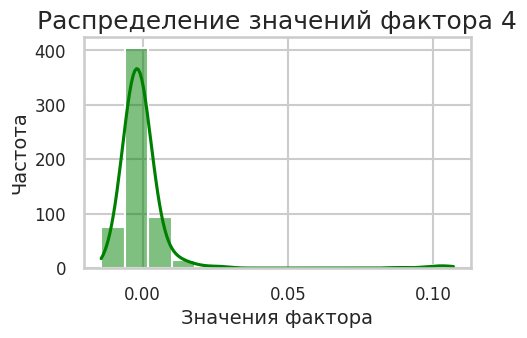

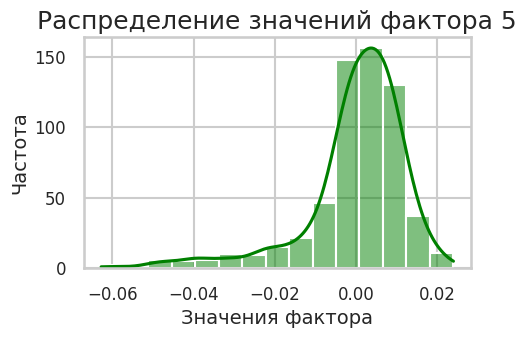

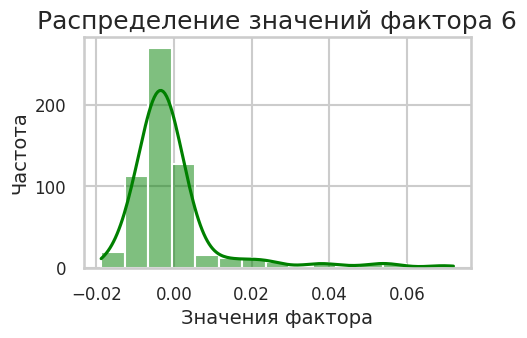

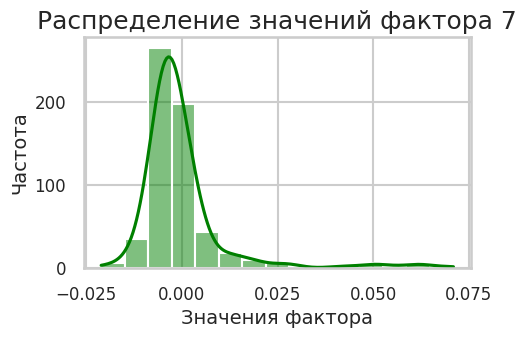

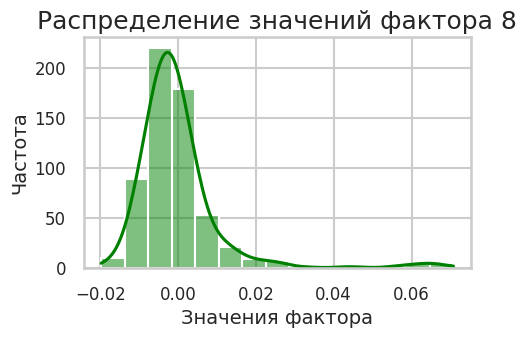

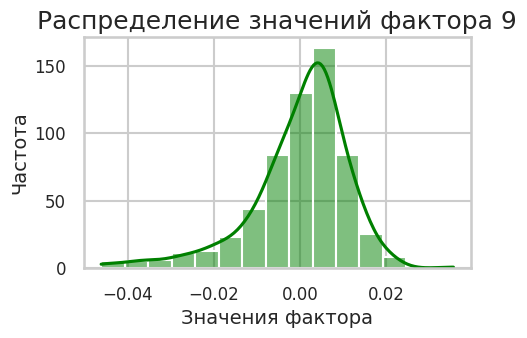

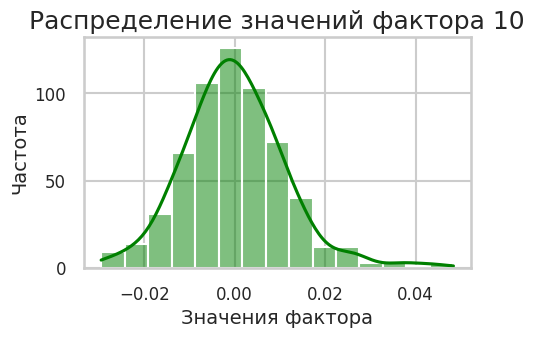

In [ ]:
modeler.factors_plot()

### Топики

+

- Реклама
- ПК и комплектующие
- Где купить ноутбук + обзоры
- ***Мошенничество***


---

-
- Развитие бизнеса
- Оценки магазинов
- Онлайн-торговля





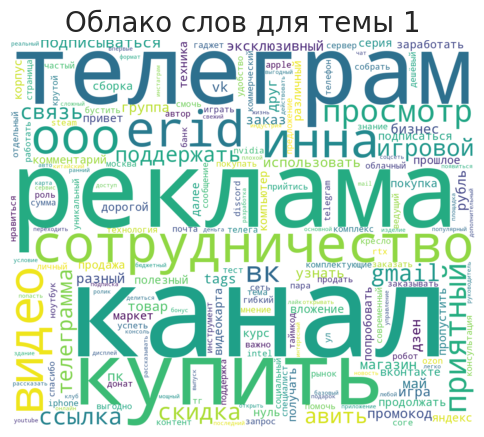

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 1  ##### 


Купить можно на *Али - Телеграм - ВК - Дзен - Boosty - = *Реклама: ООО "АЛИБАБА.КОМ (РУ)" ИНН 7703380158
------------------------------------------------------------
Покупай в магазине Vsemayki по ссылке Используй промокод на скидку 10% LYUBA624 Реклама. ООО "Всемаркет", ИНН 5406807316. erid 2VtzqxdPfUj ПОЛЕЗНЫЕ ССЫЛКИ Мой Бусти: Мой телеграм-канал: Для связи с общественностью: lyuminor123@gmail.com ПОДДЕРЖАТЬ КАНАЛ Сбербанк: 9112 3880 0909 2045 Альфа-банк: 5208 1300 1239 9568
------------------------------------------------------------
Остался всего 1 день! Успей купить постеры чтобы забрать 2 тачки и 20 гаджетов 31 мая! Постеры тут 👉 Реклама ООО"ДИДЖИТАЛСЕЙЛС", ИНН 5405092249, ERID LjN8K7N8A ===== МАГАЗИН НАШЕГО МЕРЧА Наши товары на OZON - Наша группа ВКонтакте Эксклюзивный контент в нашем Телеграмм : Наш LIFE канал (приколы со съемок и не только) ===== Для коммерческих запросов: почта: promo@garage54.ru ВК: Tags:,,,
---------------------

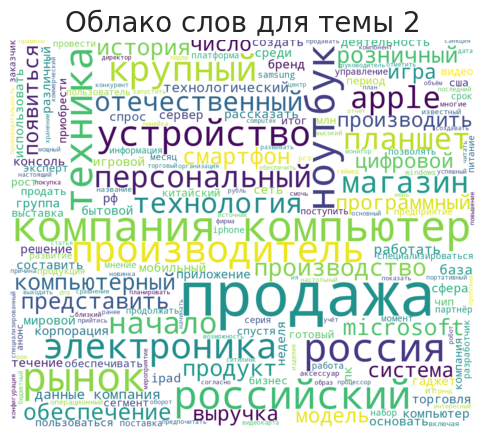

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 2  ##### 


Продолжаю серию статей про компанию Compaq и клоны IBM PC. В конце 1980-х конкуренция на рынке клонов усилилась. Корпорация IBM вела большую войну против всех: на рынке появились уже сотни компаний, они собирали клоны, бесили IBM и конкурировали между собой. Однако размер IBM был настолько велик, что мало кто мог представить, что она отступит или проиграет. Скорее, вопрос был в том, кого этот гигант раздавит первым. IBM вывела в бой тяжелую артиллерию и начала преследовать самых крупных конкурентов через суды. Дошло и до Compaq, акции которой начали падать из-за слухов о грядущих тяжбах. Правда, предстоящий суд на реальные продажи повлиял мало, и новые модели персональных компьютеров, ноутбуков и серверов продолжали выходить на рынок. А дальше случилось чудо. В первой статье мы рассмотрели период с 1982 по 1987 годы. Здесь же речь пойдет про самые успешные годы в истории Compaq Computer Corporation - 1987-1998. В третьей части мы затронем п

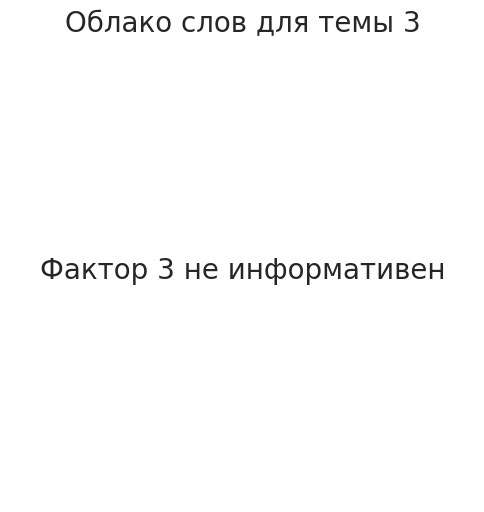

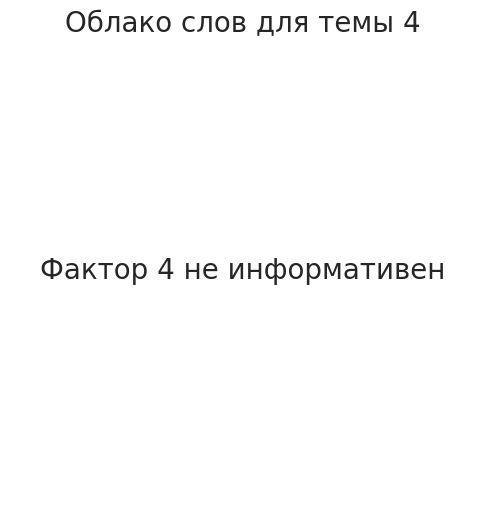

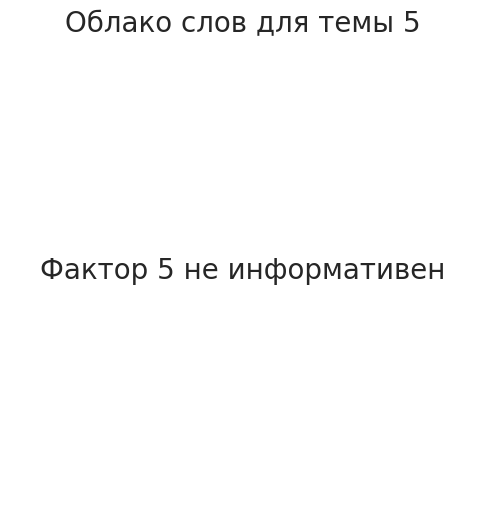

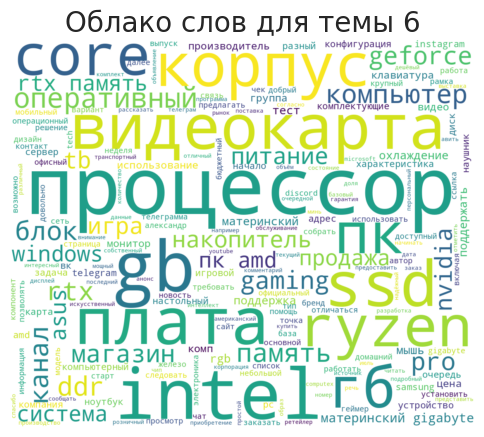

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 6  ##### 


ссылка на ТРОВО : ПК КОНФИГИ: ПРОЦЕССОР - I5 11400F ВИДЕОКАРТА - RTX3060 12GB ОПЕРАТИВНАЯ ПАМЯТЬ -16ГБ 2 ПО 8 ГБ 3200 МАТЕРИНКА - Z490A-PR0 КОРПУС - MATREX 55
------------------------------------------------------------
Для поддержки — — Вот мои характеристики компьютера: ГП: NVIDIA GeForce RTX 3060 Ti ЦП: Intel(R) Core(TM) i7-10700F CPU @2.90GHz Память: 32 GB (доступно 31.87 GB) Текущее разрешение: 2560 x 1440, 144 Гц Спасибо за внимание!
------------------------------------------------------------
В этом видео соберем и протестируем в играх комп за 70000 рублей. Бюджетная сборка ПК за 70к Тестируем XFX 6750 GRE 10Gb Видеокарту Телега @gametechpc Поддержать канал Для связи со мной chest_pc@mail.ru Игровой компьютер за 70 000 рублей проверим протестируем в играх. Процессор i5 12400f Видеокарта XFX RX 6750 GRE 10 Gb Материнская Плата MSI H610M-E ОЗУ Kllisre 2x8GB DDR4 3200 Диск Kootion m2 1Tb Блок питания 1stPlayer BlackSir 600w Охлаждение J

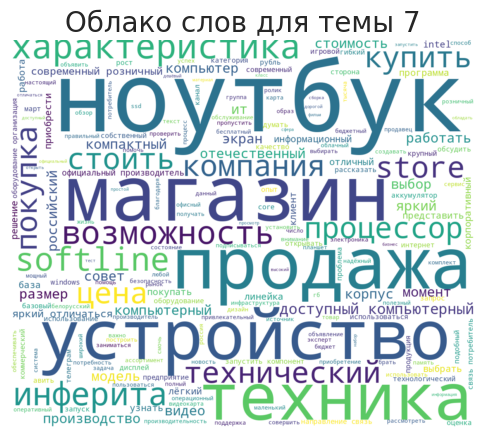

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 7  ##### 


Многодетная мать нашла на свалке дорогой ноутбук. Но когда она его открыла, то застыла, увидев...
------------------------------------------------------------
Ноутбуки "Инферит Компакт" отличаются ярким дизайном, компактными размерами и современными техническими характеристиками. Устройства доступны в официальном магазине Softline Store. В марте 2024 г. направление "Инферит Техника" представило ноутбуки Inferit Compact для корпоративных клиентов. В связи с ростом запросов на отечественное компьютерное оборудование со стороны российских потребителей "Инферит" запустил розничные продажи ноутбуков собственного производства.
------------------------------------------------------------
Этот и другие ноутбуки вы можете приобрести у нас в магазине Группа в телеграм все ноутбуки публикуются там, перед размещением на авито. Чатик с бесплатной технической поддержкой Отличный, доcтaточно сoвременный и полностью исправный ноутбук, на i3 процессоре трет

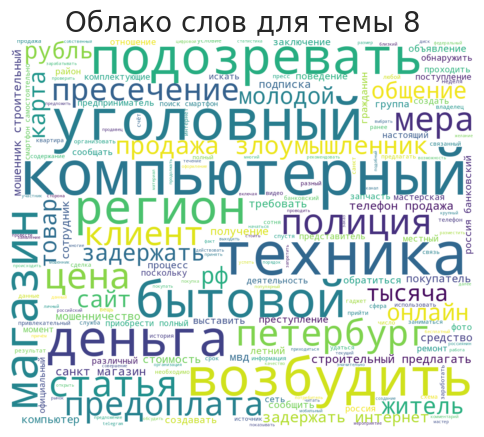

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 8  ##### 


Сотрудники МВД Санкт-Петербурга задержали подозреваемых в интернет мошенничестве в сфере продаж бытовой техники. В настоящее время рассматривается возможность возбуждения уголовного дела. В Петербурге полиция задержала группу интернет-мошенников. Злоумышленники организовали фиктивные онлайн-магазины, предлагая покупателям товары по заманчивым ценам. Они требовали предоплату за бытовую, строительную или компьютерную технику, но после получения денег прекращали любое общение с клиентами, сообщает официальный представитель МВД России Ирина Волк в своем Telegram-канале. На данный момент в отношении восьми фигурантов, проживающих в разных регионах России, возбуждено уголовное дело. У задержанных конфискованы телефоны, компьютеры, банковские карточки и другие вещи, которые могут служить доказательством в суде. Они обвиняются по статье, связанной с мошенничеством в особо крупных размерах. Шестерым из них уже избрана мера пресечения в виде содержан

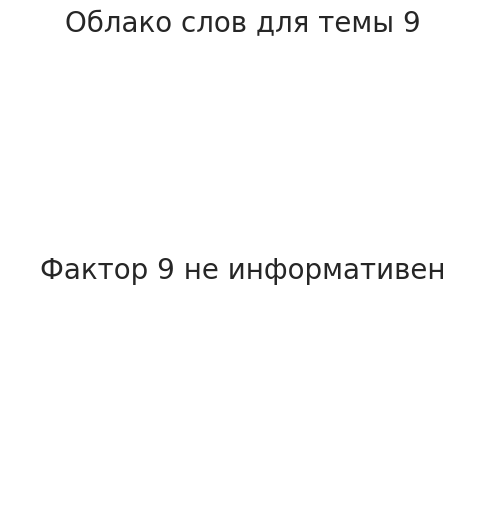

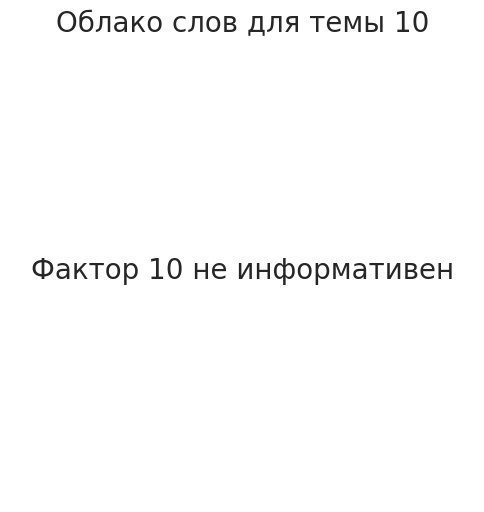




****************************** ИТОГ ****************************** 

Количество классифицированных сообщений:  107 

Количество сообщений для темы 1: 20
Количество сообщений для темы 2: 24
Количество сообщений для темы 3: 0
Количество сообщений для темы 4: 0
Количество сообщений для темы 5: 0
Количество сообщений для темы 6: 26
Количество сообщений для темы 7: 22
Количество сообщений для темы 8: 15
Количество сообщений для темы 9: 0
Количество сообщений для темы 10: 0


In [ ]:
modeler.print_topic(0.027, gpt=True, full=True, min_message_count=15, share=0.5)

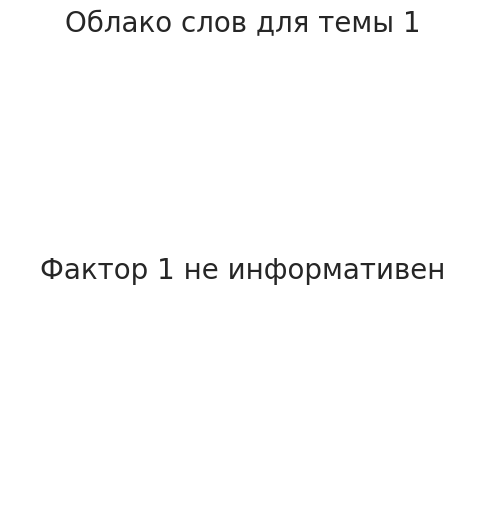

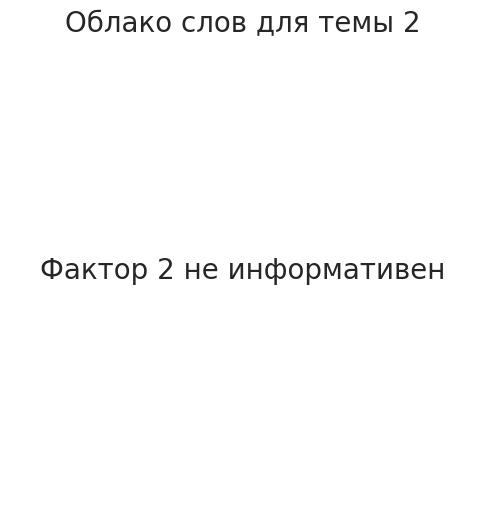

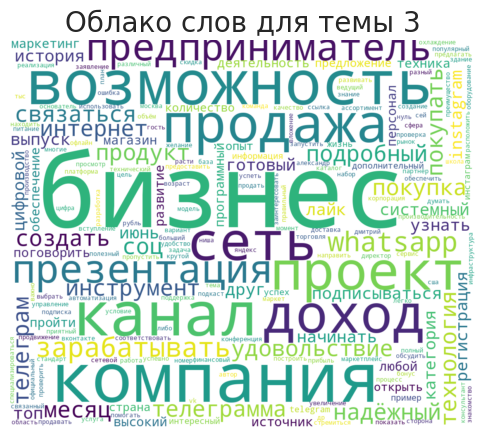

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 3  ##### 


Многие до сих пор думают что сетевой бизнес в продуктовой компании - это только продажи по каталогу и клетчатые сумки. Но это уже давным давно не так. Суть бизнеса создать товарооборот, да, но сейчас это можно делать не на продажах. Можно конечно совмещать, но чтобы построить надежный бизнес, с доходом от 100 тыс. рублей в месяц и более - это только построение структуры. 💰Подробнее про БИЗНЕС тут👉 👜Подробнее про покупки для себя 20-26% тут👉 🌺❓У Вас есть вопросы? Пишите! Мы с удовольствием ответим! С Уважением к Вам и Вашим вопросам, Бриллиантовые директора компании Фаберлик, Ольга и Александр Дубяга. Вы можете найти нас в телеграмме. 💖Наш телеграмм: @Olga_Dubyaga ( Так же Вы можете связаться с нами в соц. сетях. 💖Наша страничка ВКонтакте: 💖Наша страничка в Одноклассниках:
------------------------------------------------------------
Что за машина корпорация Бизнес мама? Разговор с основательницей Маркетологом Юлией Пуртовой
-----------------

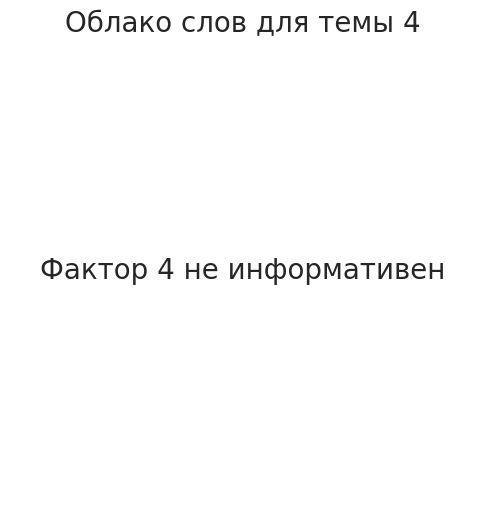

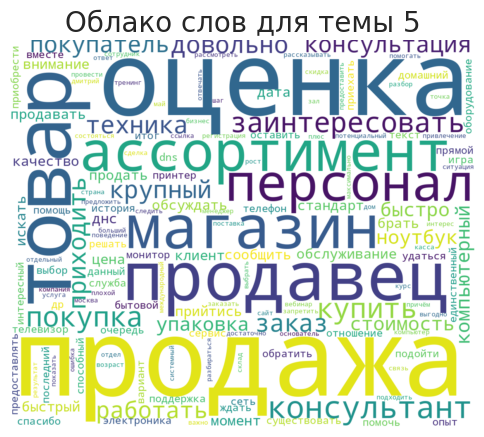

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 5  ##### 


Оценка 5 из 5. Роман спасибо за консультацию и продажу оборудования!
------------------------------------------------------------
Оценка 5 из 5. Хороший ТЦ.Купила вDNS принтер очень хорошо работает и есть картриджи к нему в продаже . Везде чисто окуратно и ненадо не куда ехать.. Все под боком..
------------------------------------------------------------
Оценка 2 из 5. Последнее время DNS на Камчатке очень расстраивает из-за своего сервиса, вернее его отсутствия. Продавцы не компетентные, заинтересованности в продажах отсутствуют, совсем. Пришлось даже ждать продавца, чтобы он ответил на вопрос о ноутбуке, сам в этот момент складывал пустые коробки, для меня это странно... Несколько раз заходила за покупками и разворачивалась, очень раздражает такое отношение. Неожиданно , но в Эльдорадо дела обстоят лучше с персоналом
------------------------------------------------------------
Оценка 1 из 5. Продавцы,к сожалению, с не заинтересованы в про

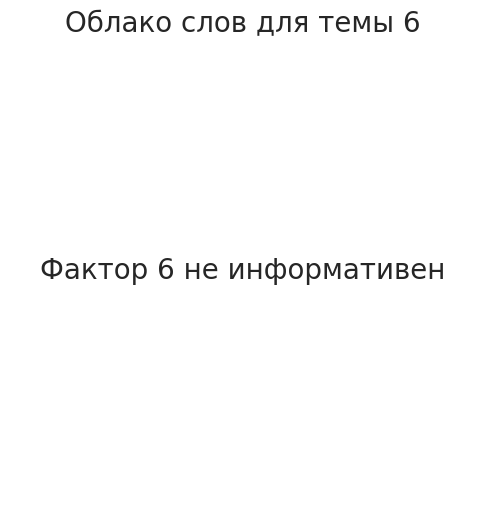

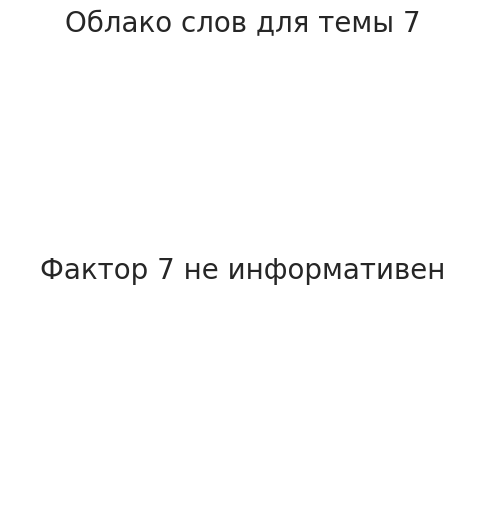

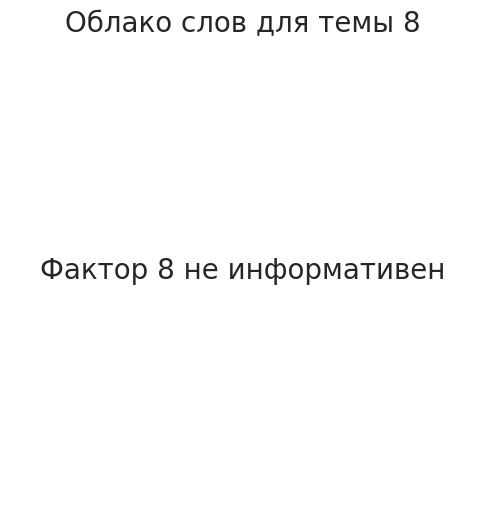

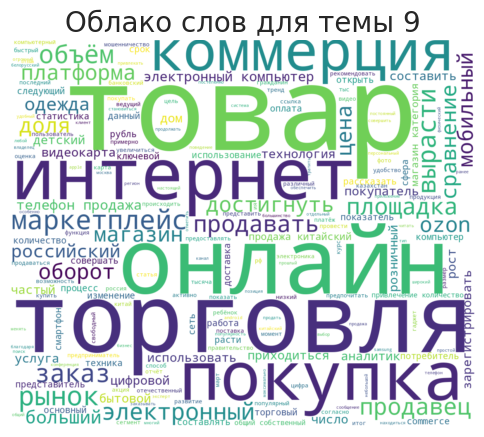

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 9  ##### 


Бюро нацстатистики: казахстанцы в основном покупают товары на маркетплейсах В бюро рассказали, какие товары граждане покупали онлайн в 2023 году. Чаще всего покупают технику, передает nv.kz со ссылкой на informburo.kz. «Размер электронной коммерции в общем объеме торговли составил 12,7%, или 2,4 триллиона тенге. Больше всего товаров покупают через маркетплейсы (72,4%). Через отдельные электронные магазины оборот составил 27,6%», - говорится в сообщении. Предприниматели продают товары онлайн: - через маркетплейсы – 79,7%; - через собственные интернет-магазины – 30,3%. Из них 10% используют обе платформы для продаж. На маркетплейсах чаще всего покупают: - телефоны и гаджеты – 27,5%; - бытовую технику – 11,6%; - компьютерные товары и ПО – 10,1%; - автотовары – 7,9%. Больше всего казахстанцы заказывают онлайн-услуги по бронированию мест на транспорт (38%) и перевозке пассажиров (37,4%). Фото: openbusiness.ru
------------------------------------

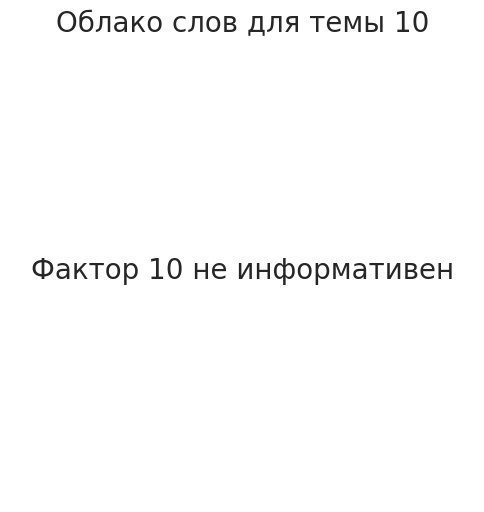




****************************** ИТОГ ****************************** 

Количество классифицированных сообщений:  57 

Количество сообщений для темы 1: 0
Количество сообщений для темы 2: 0
Количество сообщений для темы 3: 15
Количество сообщений для темы 4: 0
Количество сообщений для темы 5: 26
Количество сообщений для темы 6: 0
Количество сообщений для темы 7: 0
Количество сообщений для темы 8: 0
Количество сообщений для темы 9: 16
Количество сообщений для темы 10: 0


In [ ]:
modeler.print_topic(-0.03, sign='-', gpt=True, full=True, min_message_count=15, share=0.5)

## Исследование comps2 (700)

In [ ]:
df__ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/comps2.csv', sep=';', on_bad_lines='skip')

In [ ]:
preprocessed__ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/modified2.csv')

In [ ]:
modeler2 = TopicModeler(df__['Сообщение'].to_frame(), sw_, preprocessed__)

In [ ]:
%%time
modeler2.drop_similar_messages(1.3)

Количество текстов: 781

Количество текстов без полных дубликатов: 762

Количество текстов после удаления похожих: 414

CPU times: user 895 ms, sys: 6.97 ms, total: 902 ms
Wall time: 912 ms


In [ ]:
modeler2.clustered_df.value_counts('cluster')

cluster
33     9
16     7
370    6
216    6
336    6
      ..
245    1
125    1
247    1
248    1
414    1
Name: count, Length: 414, dtype: int64

In [ ]:
modeler2.clustered_df[modeler2.clustered_df['cluster']==16]['Сообщение']

324    Назад в 90-е? В России стали чаще собирать ПК ...
556    Доля «кустарных» настольных компьютеров в прош...
576    На IXBT вышла занятная, но вполне очевидная ин...
579    Доля "кустарных" настольных компьютеров в прош...
581    По сообщению "Известий" со ссылкой на отчет ко...
583    Назад в 90-е? В России стали чаще собирать ПК ...
584    По сообщению "Известий" со ссылкой на отчет ко...
Name: Сообщение, dtype: object

Создание эмбеддингов, добавление в базу...


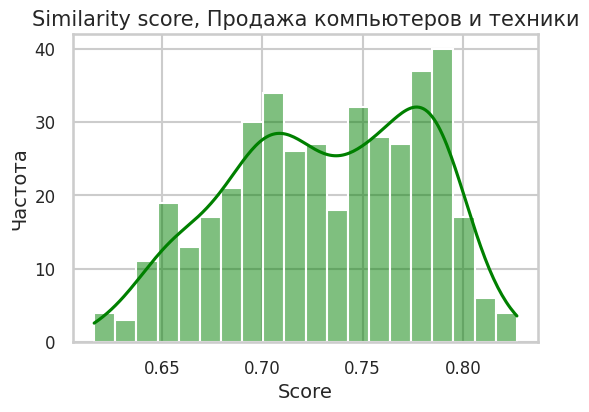

In [ ]:
modeler2.faiss_query('Продажа компьютеров и техники', plot=True)

In [ ]:
modeler2.get_most_relevant(0.85)

Количество релевантных текстов: 352



In [ ]:
modeler2.for_analysis

,Сообщение
0,Сборка ПК - продажа компьютеров Сборка ПК - ка...
1,В эпоху стремительного технологического прогре...
2,👨‍💻 Продажа компьютеров и периферийных устройс...
3,Техника в каждый дом: россияне стали чаще поку...
4,Доля продаж компьютеров отечественного произво...
...,...
347,Группа вконтакте с новостями и оповещениями - ...
348,Дисциплина: Основы программирования на Python....
349,Ничего не помогает - ребенок не слушается ⠀ Пр...
350,"Несчастья Милы начались, когда она явилась в р..."


In [ ]:
%%time
modeler2.vectorize_text()

Предобработка текстов...

Всего уникальных слов: 5504
 Из них берем максимум 25.0 процентов
TF-IDF...
CPU times: user 52.9 s, sys: 3.42 s, total: 56.3 s
Wall time: 56.8 s


In [ ]:
modeler2.perform_pca(10, kernel_type='sigmoid')

In [ ]:
modeler2.embs_and_text

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,Сообщение
0,-0.002022,-0.017378,-0.012023,-0.026409,-0.023253,0.001627,0.011760,0.007419,-0.006660,0.035917,Сборка ПК - продажа компьютеров Сборка ПК - ка...
1,0.009110,-0.001360,-0.001598,-0.003512,-0.004576,0.006381,0.003419,-0.026399,0.011275,0.000854,В эпоху стремительного технологического прогре...
2,-0.002500,-0.002459,0.002215,-0.007811,-0.002897,-0.001487,-0.015927,-0.015935,0.003375,0.003526,👨‍💻 Продажа компьютеров и периферийных устройс...
3,-0.010763,-0.002011,0.009179,0.008845,-0.008099,-0.003735,0.008508,0.010878,0.002738,0.011264,Техника в каждый дом: россияне стали чаще поку...
4,-0.008141,-0.004266,0.015451,0.050494,-0.011054,-0.007073,0.005959,0.003553,0.001943,-0.007631,Доля продаж компьютеров отечественного произво...
...,...,...,...,...,...,...,...,...,...,...,...
347,-0.014663,-0.001916,0.012228,-0.008870,-0.002853,0.000167,-0.002035,-0.021539,-0.012868,0.004558,Группа вконтакте с новостями и оповещениями - ...
348,-0.009221,-0.004913,0.007594,-0.004660,0.000079,0.005164,-0.008564,-0.009223,-0.002688,-0.004918,Дисциплина: Основы программирования на Python....
349,-0.008754,-0.002360,0.005408,-0.002968,-0.002608,0.002417,-0.005014,-0.018324,-0.000781,-0.000133,Ничего не помогает - ребенок не слушается ⠀ Пр...
350,-0.011072,-0.006523,0.008687,-0.006917,-0.005980,0.006125,0.003054,-0.032417,-0.011505,0.001733,"Несчастья Милы начались, когда она явилась в р..."


In [ ]:
modeler2.scree_plot()

Для KernelPCA невозможно посчитать долю объясненной дисперсии


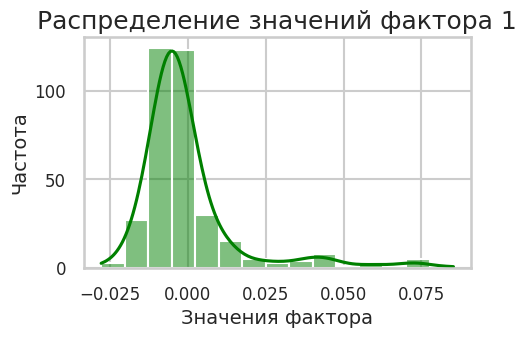

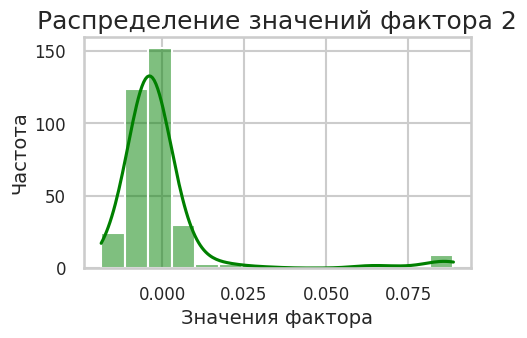

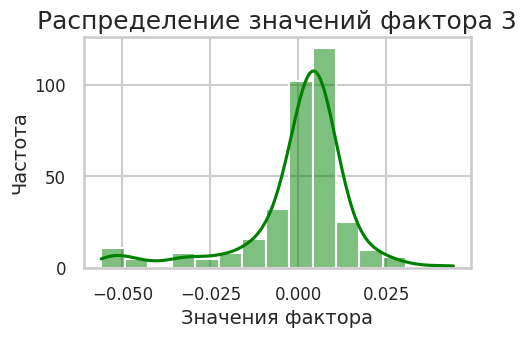

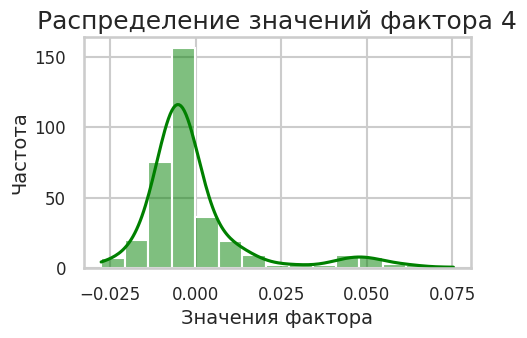

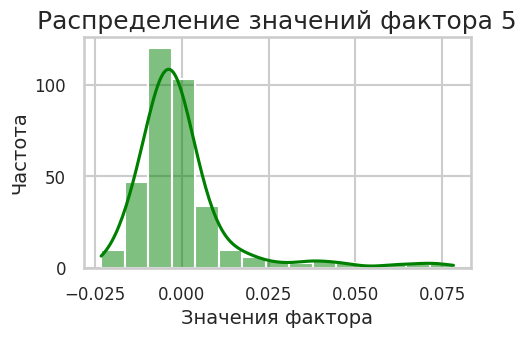

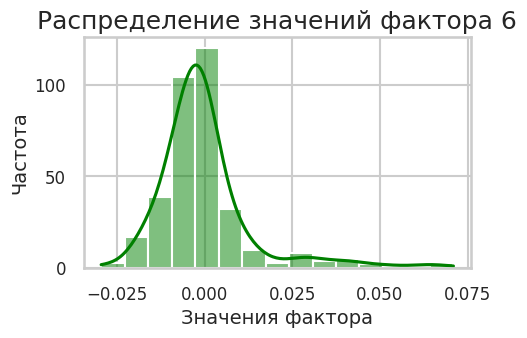

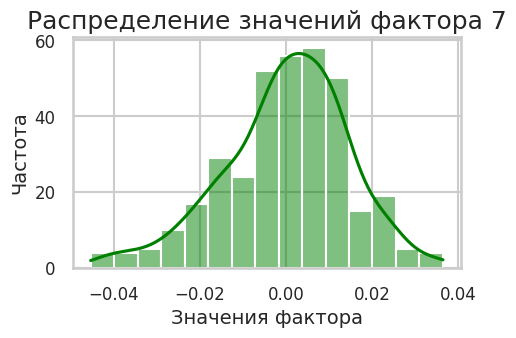

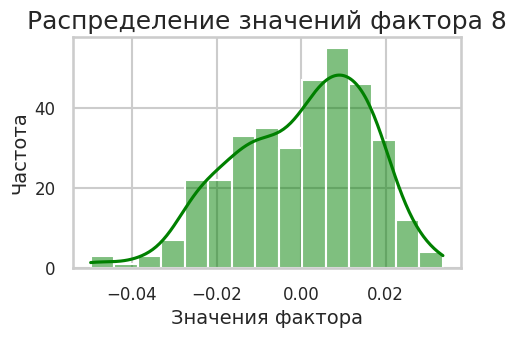

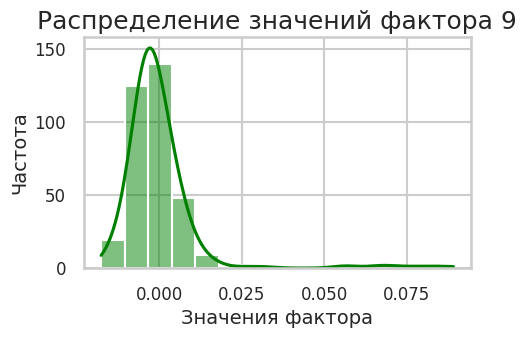

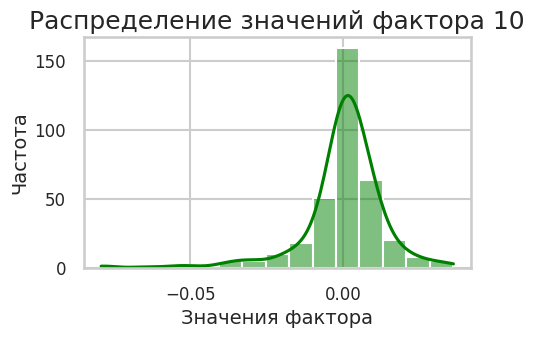

In [ ]:
modeler2.factors_plot()

### Топики

+
- Рост популярности кустарной сборки ПК
- **Игровая техника/ игры**
- **Рост продаж отечественных компьютеров**
- **ИТ компании: контакты и адреса**
- ***ПК и комплектующие***
---

-
- ***Мошенничество***
- Восстановление рынка компьютеров после спада
- Рост продаж российских компьютеров в корпоративном секторе
- **Apple**




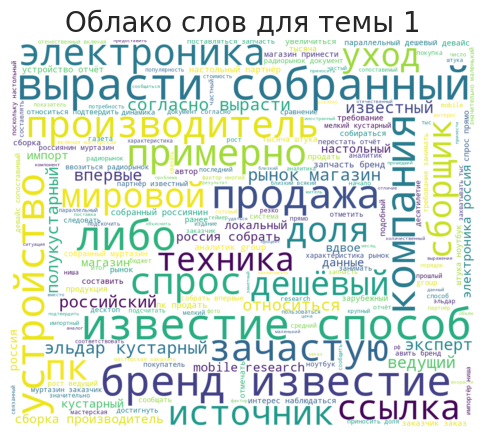

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 1  ##### 


Читайте МН в TELEGRAM ДЗЕН По итогам 2023 года спрос жителей России на компьютеры, собранные кустарным способом в магазинах электроники и мелких мастерских, увеличился в 2 раза. Компьютеры, которые собираются под заказ (нередко и запчасти к ним приносят сами заказчики) и не относятся к какому-либо бренду, стали пользоваться популярностью у россиян за последние 12 месяцев. По данным отчета компании-партнера нескольких производителей электроники, доля таких устройств на российском рынке за год выросла с 11 до 20%. В количественном выражении показатель достиг отметки в 260 тысяч штук. По словам ведущего аналитика Mobile Research Group Эльдара Муртазина, увеличение интереса к подобным девайсам в РФ наблюдается впервые за несколько десятилетий. Он считает, что эта динамика связана с рядом факторов, включая уход многих зарубежных производителей с отечественного рынка. Также компьютеры, собранные "на коленке", часто стоят дешевле импортных аналого

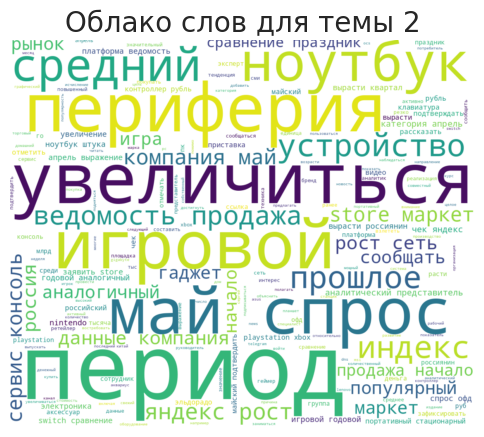

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 2  ##### 


В апреле и начале мая продажи игровых ноутбуков выросли в штуках на 60% по сравнению с аналогичным периодом 2023 года, заявил представитель «Яндекс маркета». В тот же период в сети re:Store продажи компьютеров выросли на 12%, пишут Ведомости. Абсолютные значения площадки не раскрывают. news.novgorod.ru
------------------------------------------------------------
Наблюдается значительный рост продаж компьютеров, ноутбуков и игровых аксессуаров. Такую тенденцию отмечают и другие игроки рынка. Например, в "Яндекс Маркете" сообщили, что продажи игровых ноутбуков увеличились на 60% по сравнению с прошлым годом. Кроме того, реализация игровых приставок за этот период выросла на 51%, а средняя стоимость покупки - на 12%, до 25 050 рублей. Самыми популярными игровыми приставками среди россиян стали PlayStation, Xbox и Nintendo Switch. Специалисты объясняют рост продаж игровых устройств несколькими причинами, включая традиционное увеличение активнос

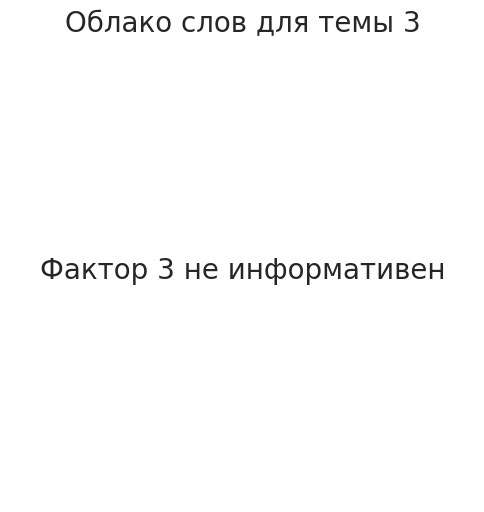

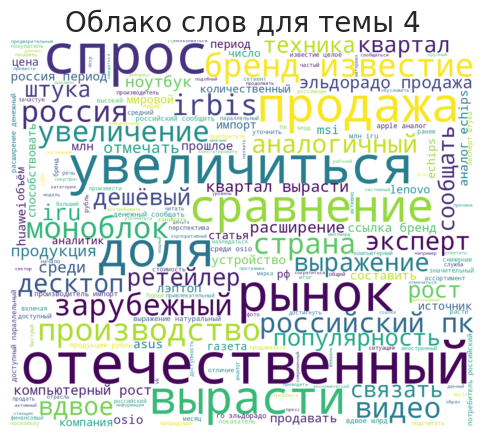

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 4  ##### 


Доля продаж компьютеров отечественного производства увеличилась до 20%. Статья Продажи компьютеров российских брендов увеличились вдвое m.vk.com
------------------------------------------------------------
КОМПЬЮТЕРЫ В СТРАНЕ В России вдвое увеличилась доля продаж отечественных компьютеров. В I квартале 2024-го по сравнению с аналогичным периодом прошлого года спрос на компьютеры (лэптопы, десктопы и моноблоки) в России вырос в натуральном выражении на 44%, до 1,3 млн штук.
------------------------------------------------------------
Доля продаж компьютеров российских брендов за год выросла вдвое. Об этом сообщает газета "Известия" со ссылкой на экспертов. Источник: Рамблер
------------------------------------------------------------
Продажи российских компьютеров для бизнеса выросли на 71% за год — до 100 000 штук 👍 Больше всего отечественную продукцию закупают компании нефтегазовой, образовательной, финансовой и энергетической отраслей. В

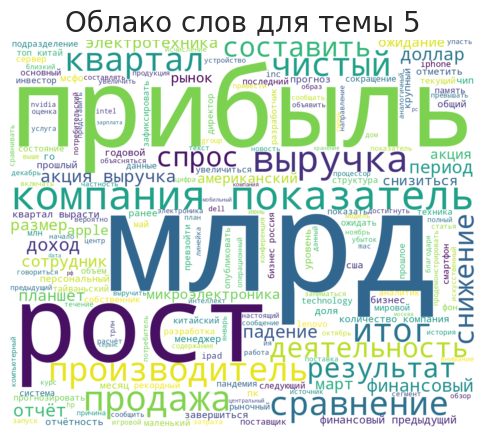

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 5  ##### 


Компания Электротехника и микроэлектроника С 1984 года Россия Центральный ФО РФ Китай Азия Москва Lenovo - китайский поставщик компьютерной техники и мобильных устройств. Собственники: Google - 5,9% Выручка и прибыль по МСФО млрд $ Количество сотрудников компании Структура бизнеса По состоянию на май 2019 года структура бизнеса Lenovo поделена между следующими основными подразделениями: Lenovo PC & Smart Device Business (компьютеры, крупноразмерные смартфоны, планшеты, игровые устройства, домашняя электроника); Lenovo Data Center Group (серверы, системы хранения данных, ПО, сервисы). Lenovo в России и СНГ Основная статья: Lenovo Россия Зарплаты сотрудников Средняя зарплата в литовском подразделении Lenovo Technology B.V. по данным на июнь 2017 года, составляет 8200 евро в месяц [1]. Показатели деятельности Основная статья: Финансовые показатели Lenovo 2023: Падение выручки на 14% до $61,95 млрд из-за обвала спроса на ПК и смартфоны По итога

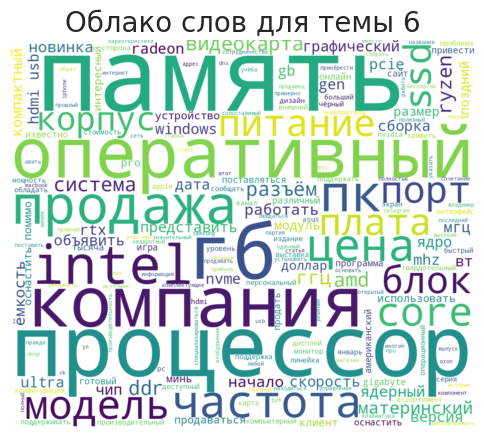

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 6  ##### 


💻💻💻 ПРОДАЖА КОМПЬЮТЕРА💻💻💻 проц - A10-6700 мат.плата - GA-F2A78M-D3H GIGABYTE рперативная память - 4 гб ХДД - 500гб В стендовом открытом корпусе (можно собрать в обычном). !!! ВИДЕОКАРТУ МОЖНО ПОСТАВИТЬ ЛЮБУЮ !!! Виндовс 10+программы Полностью готов к работе в интернете, учёбе и не очень требовательным играм. цена 10000р.
------------------------------------------------------------
Для одного счастливчика наступил очень удачный день, когда онлайн-аукцион суперкомпьютера Соединенных Штатов Cheyenne окончился выигрышной ставкой в размере 480 тысяч долларов. Аукцион привлек 27 участников, которые боролись за часть истории суперкомпьютеров. Победитель торгов получил 64-разрядный суперкомпьютер с 8064 18-ядерными 36-поточными камнями Intel Xeon E5-2697 v4, работающими на частоте 2,3 ГГц. Компьютер также поставляется с 313 терабайтами оперативной памяти, разделенной на 4890 модулей, каждый емкостью 64 ГБ, которые стоят примерно 65 долларов каждый.

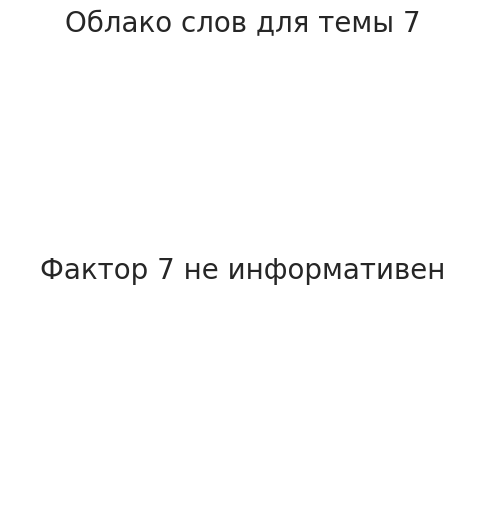

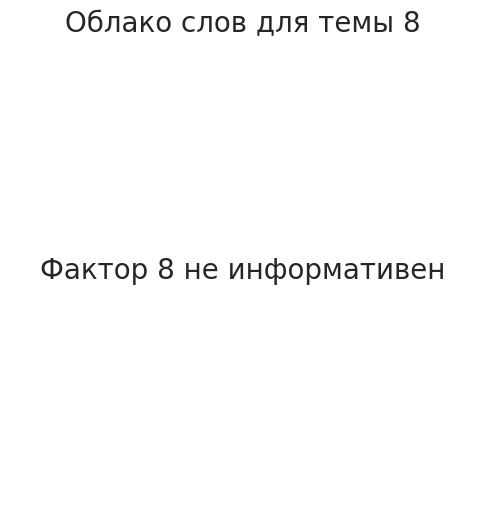

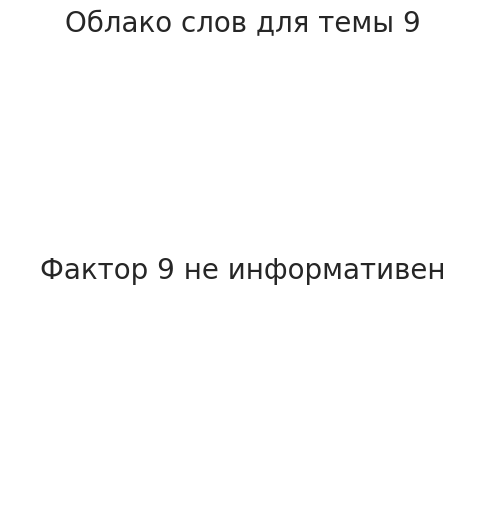

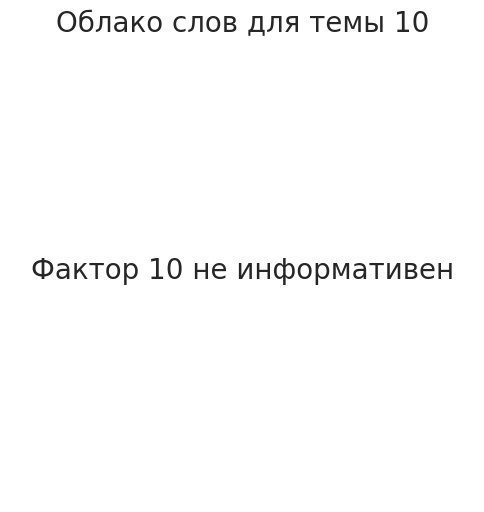




****************************** ИТОГ ****************************** 

Количество классифицированных сообщений:  101 

Количество сообщений для темы 1: 24
Количество сообщений для темы 2: 15
Количество сообщений для темы 3: 0
Количество сообщений для темы 4: 26
Количество сообщений для темы 5: 18
Количество сообщений для темы 6: 18
Количество сообщений для темы 7: 0
Количество сообщений для темы 8: 0
Количество сообщений для темы 9: 0
Количество сообщений для темы 10: 0


In [ ]:

modeler2.print_topic(0.03, gpt=True, full=True, min_message_count=10)

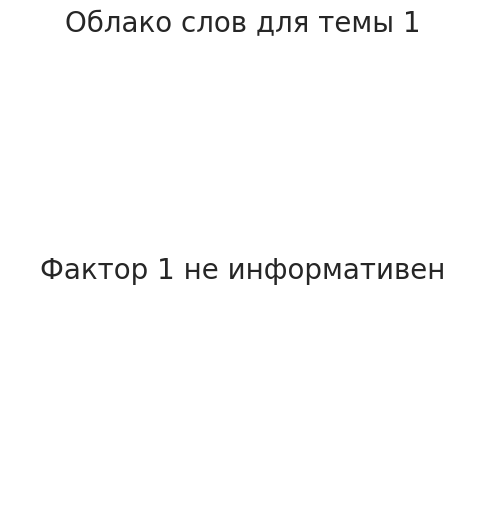

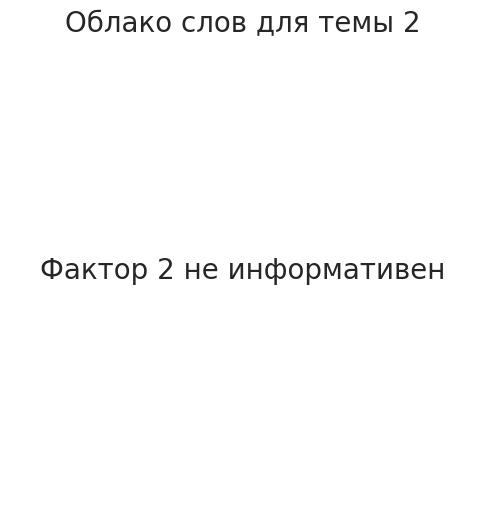

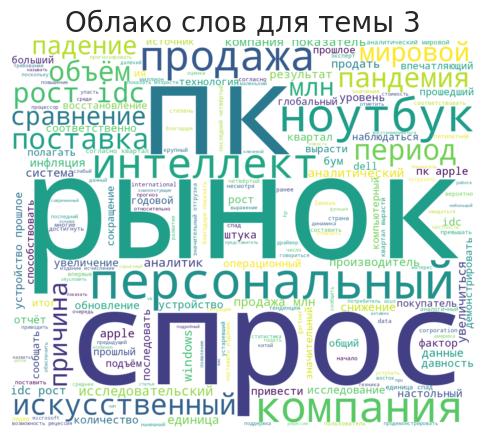

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 3  ##### 


Рынок ПК снова на подъеме — в чем причина? Компьютеры снова пользуются большим спросом, и причина тому сразу несколько факторов, среди которых и активное развитие искусственного интеллекта. Как сообщает аналитическое издание IDC, после двух лет рецессии мировой рынок снова демонстрирует рост продаж компьютеров. За прошедший период 2024 года настольных ПК поставили в количестве 57,2 млн единиц, а ноутбуков — 45,1 млн. Это больше на 3,2% и 4,2% соответственно в годовом исчислении относительно прошлых лет. Рост не впечатляющий, но он есть, и со временем должен еще увеличиться. О том,… Хештеги .mail.ru Ссылка
------------------------------------------------------------
Глобальные продажи персональных компьютеров упали до минимума 17-летней давности. О падении рынка рассказали в исследовательской компании Gartner. По оценкам экспертов, в 2023 году производители по всему миру отгрузили 241,8 млн десктопов и ноутбуков, что на 14,8% меньше, чем год

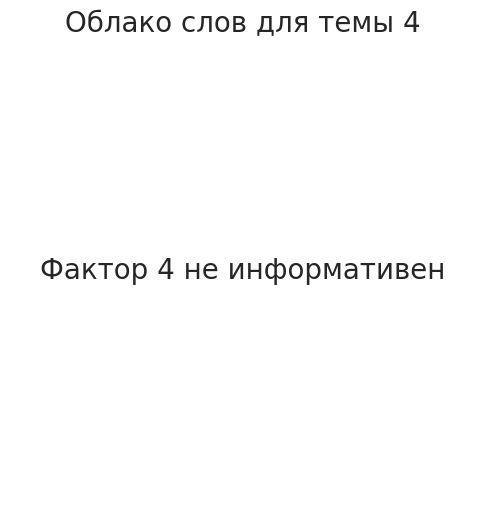

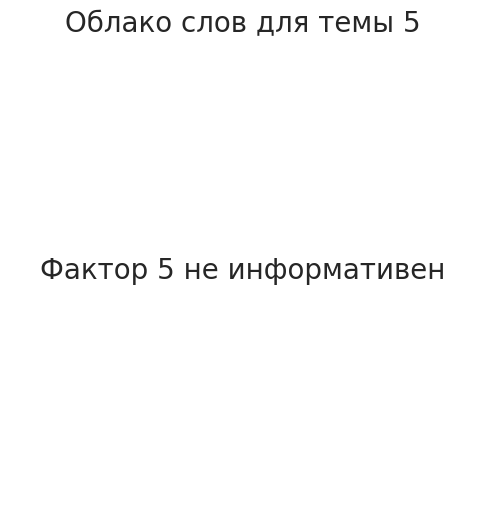

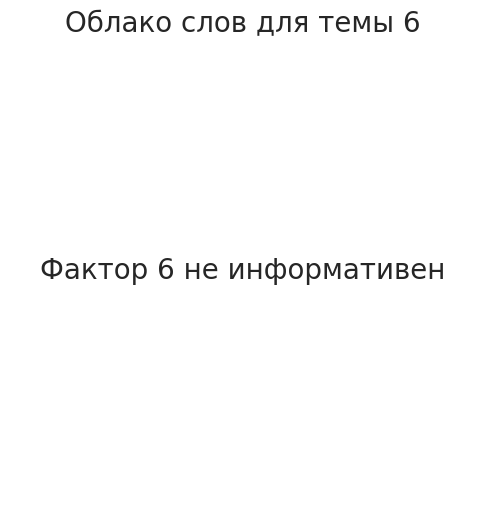

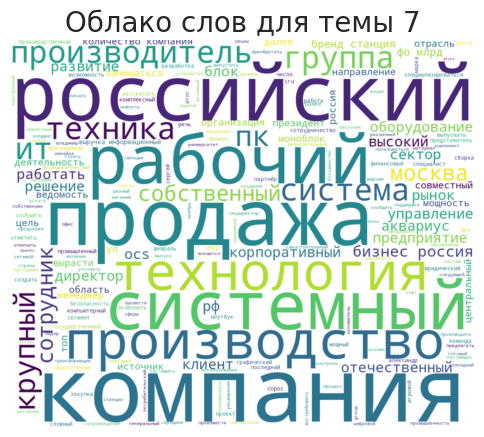

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 7  ##### 


Продажи российских компьютеров для бизнеса выросли на 71% за год — до 100 000 штук 👍 Больше всего отечественную продукцию закупают компании нефтегазовой, образовательной, финансовой и энергетической отраслей. В основном, это крупные госкорпорации и компании с госучастием. Всего за год отечественные компании произвели около 500 000 системных блоков, моноблоков и рабочих станций. Самыми востребованными отечественными ПК в России оказались компьютеры брендов DEXP, iRu, ICL, Depo и «Аквариус». На российские марки приходится уже около четверти всего рынка продаж компьютеров в нашей стране.
------------------------------------------------------------
По итогам 2023 года продажи компьютеров для офиса, включая системные блоки, моноблоки и рабочие станции, в корпоративном секторе выросли на 71 % и составили 100 000 шт., сообщают "Ведомости" со ссылкой на данные компании OCS Distribution. Источник изображений: louisehoffmann83 / pixabay.com В 2023 го

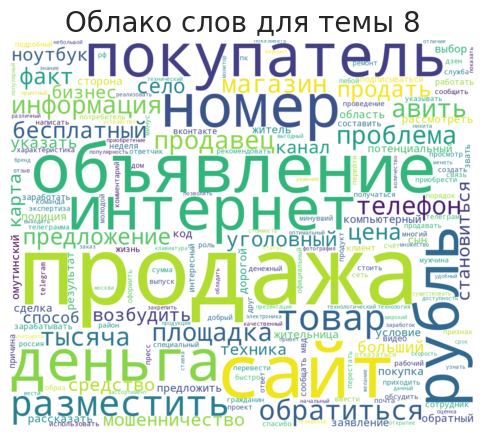

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 8  ##### 


Жительница Тюменской области, желая продать компьютер, лишилась более 9 тысяч рублей Заявительница из села Омутинское рассказала, что на сайте бесплатных объявлений ее сын разместил информацию о продаже компьютера. На предложение откликнулся потенциальный покупатель. Обсудив с продавцом условия сделки, он предложил молодому человеку перейти на "специальный сайт", где тот ввел номер карты, а также трехзначный код с обратной стороны. После чего потерпевшая обнаружила списание всех средств. По факту возбуждено уголовное дело. ЧС Тобольск
------------------------------------------------------------
Из-за сайта-двойника житель Тверской области лишился 72 тысяч рублей. Он воспользовался сайтом по продаже компьютеров, чтобы приобрести ноутбук. Он оформил покупку и перевел деньги на счёт, который был указан на сайте. После оплаты он позвонил в магазин, узнать статус заказа, но ему сообщили, что покупки не было. Мужчина обратился в полицию.
--------

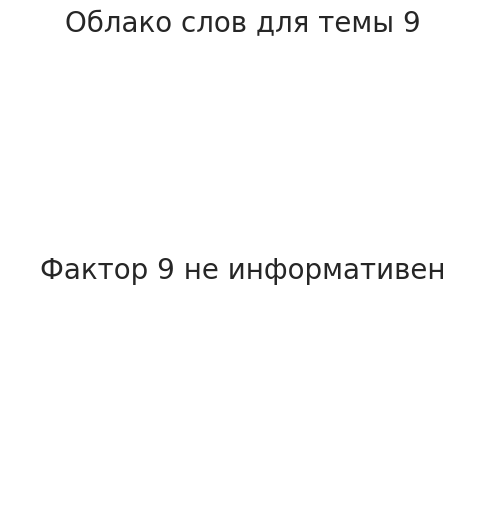

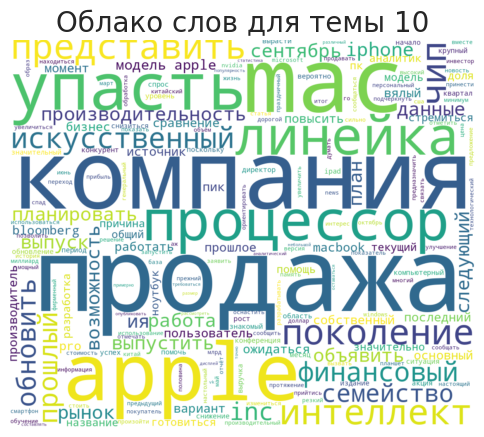

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 10  ##### 


Apple Inc., стремясь повысить вялые продажи компьютеров, готовится обновить всю свою линейку Mac с помощью нового семейства процессоров собственного ... android-robot.com
------------------------------------------------------------
18 февраля 1984 г. — Стив Возняк выступает в средней школе Индепенденс, Индепенденс, штат Огайо, на мероприятии, организованном Группой пользователей Apple на северо-востоке Огайо (NEO Apple Corps). Темы включают: журнал Byte; комплекты микрокомпьютеров; Домашний компьютерный клуб; узнает о MITS, Altair 8800, Basic и дискетах; проектирует компьютер на базе Motorola 6800; микропроцессор MOS 6502 Basic, продаваемый Microsoft (5:03); копии Microsoft Basic создаются в микрокомпьютерном клубе Homebrew (7:10); продажа компьютерной техники в Компьютерном клубе Homebrew; пишет Basic для микропроцессора MOS 6502; строит компьютер (Apple I) на базе микропроцессора MOS 6502; Стив Джобс предлагает собрать компьютерные платы

In [ ]:

modeler2.print_topic(-0.025, sign='-', gpt=True, full=True, min_message_count=10, share=0.5)

## Исследование comps3 (2000)

In [ ]:
df___ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/comps3.csv', sep=';', on_bad_lines='skip')

In [ ]:
preprocessed__ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/modified3.csv')

In [ ]:
modeler3 = TopicModeler(df___['Сообщение'].to_frame(), sw_, preprocessed__)

In [ ]:
%%time
modeler3.drop_similar_messages(1.3)

Количество текстов: 2094

Количество текстов без полных дубликатов: 2068

Количество текстов после удаления похожих: 1246

CPU times: user 6.49 s, sys: 56.5 ms, total: 6.54 s
Wall time: 6.58 s


In [ ]:
#modeler3.initial_preprocessed.to_csv('/content/drive/MyDrive/Совкомбанк/Comps/modified3.csv', index=False)

In [ ]:
modeler3.clustered_df.value_counts('cluster')

cluster
1149    12
707      9
1088     9
1154     9
710      9
        ..
661      1
662      1
663      1
664      1
624      1
Name: count, Length: 1246, dtype: int64

In [ ]:
modeler3.clustered_df[modeler3.clustered_df['cluster']==707]['Сообщение']

683    Это происходит благодаря реализации программ г...
866    В январе 2024 года оборот обрабатывающей промы...
867    Поделиться Распечатать Копировать Это происход...
879    Это происходит благодаря реализации программ г...
882    Значимую долю в обороте обрабатывающих компани...
884    В январе 2024 года оборот обрабатывающей промы...
885    В январе 2024 года оборот обрабатывающей промы...
890    В январе 2024 года оборот обрабатывающей промы...
891    Это происходит благодаря реализации программ г...
Name: Сообщение, dtype: object

Создание эмбеддингов, добавление в базу...


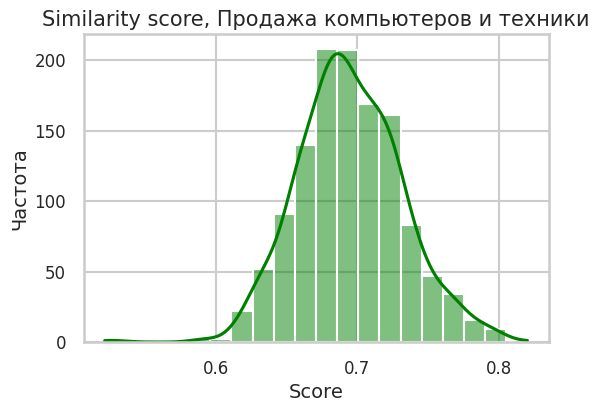

In [ ]:
modeler3.faiss_query('Продажа компьютеров и техники', plot=True)

In [ ]:
modeler3.get_most_relevant(0.4)

Количество релевантных текстов: 498



In [ ]:
modeler3.for_analysis

,Сообщение
0,"ООО ""ТЕХНОКОН"" за 2023 год получило чистую при..."
1,ТД Кормелл Знание техник продаж. Отличные комм...
2,Рынок российской компьютерной техники зафиксир...
3,Каждый пятый продаваемый в РФ компьютер - росс...
4,Продажи отечественных компьютеров в России уве...
...,...
493,Под коммутаторами (другое название - свитчи) п...
494,⚡ Доходы Apple от продаж iPhone снижаются Комп...
495,Переходи в мой Telegram канал забирай таблицу ...
496,Методика тестирования накопителей образца 2021...


In [ ]:
%%time
modeler3.vectorize_text(reinit=True)

Предобработка текстов...

Всего уникальных слов: 6649
 Из них берем максимум 25.0 процентов
TF-IDF...
CPU times: user 1min 14s, sys: 4.76 s, total: 1min 19s
Wall time: 1min 20s


In [ ]:
modeler3.perform_pca(10, kernel_type='sigmoid')

In [ ]:
modeler3.embs_and_text

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,Сообщение
0,0.017395,-0.022736,-0.030872,-0.008515,-0.005434,-0.017889,-0.016658,-0.014074,-0.017592,0.038839,"ООО ""ТЕХНОКОН"" за 2023 год получило чистую при..."
1,-0.021363,-0.004858,0.004995,-0.003015,-0.004461,-0.001425,0.009787,-0.001871,0.016053,-0.005913,ТД Кормелл Знание техник продаж. Отличные комм...
2,0.000558,0.043635,-0.002429,-0.008293,0.000780,-0.001853,0.008896,0.002228,0.007729,0.004203,Рынок российской компьютерной техники зафиксир...
3,0.017527,0.046054,-0.011699,-0.019436,0.001601,0.000070,-0.008697,0.004296,0.029528,0.010417,Каждый пятый продаваемый в РФ компьютер - росс...
4,0.004233,0.038513,-0.008737,-0.007139,-0.002893,-0.006348,0.007320,-0.007506,0.023930,-0.000223,Продажи отечественных компьютеров в России уве...
...,...,...,...,...,...,...,...,...,...,...,...
493,-0.011604,0.010203,0.003339,-0.002759,0.001492,-0.000919,0.011905,0.003126,-0.001866,-0.012802,Под коммутаторами (другое название - свитчи) п...
494,0.002883,-0.011099,-0.008260,-0.001267,0.005394,0.061088,0.002665,0.026550,0.004013,0.001216,⚡ Доходы Apple от продаж iPhone снижаются Комп...
495,-0.042167,0.003331,-0.009946,0.000372,0.000361,0.004835,-0.003400,-0.005933,-0.001399,-0.024012,Переходи в мой Telegram канал забирай таблицу ...
496,-0.018272,0.022900,0.001060,-0.002372,-0.000392,0.000099,0.001204,0.003109,-0.002127,-0.009032,Методика тестирования накопителей образца 2021...


In [ ]:
modeler3.scree_plot()

Для KernelPCA невозможно посчитать долю объясненной дисперсии


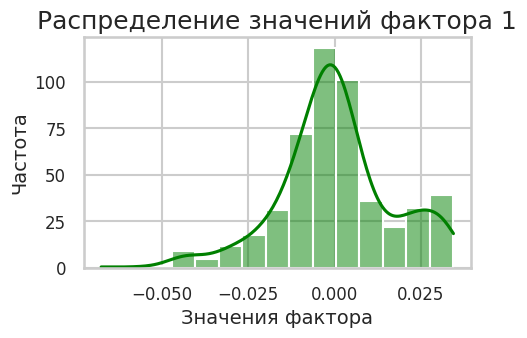

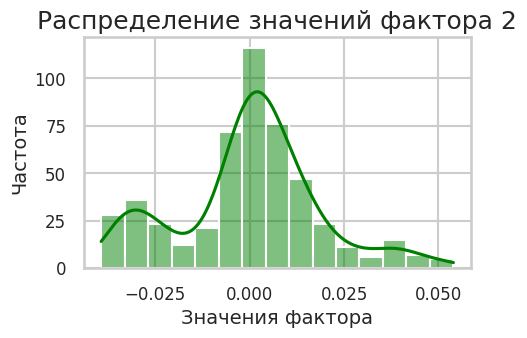

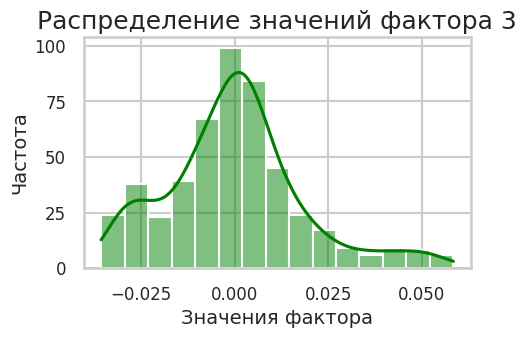

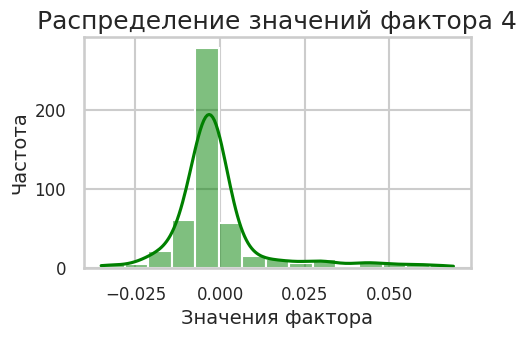

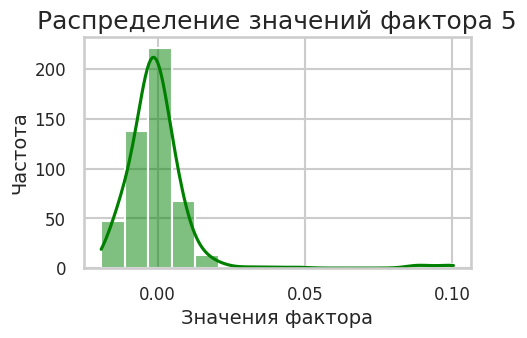

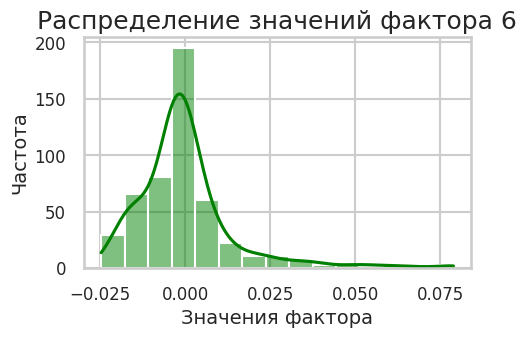

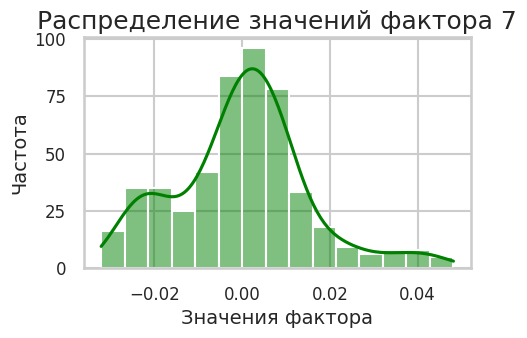

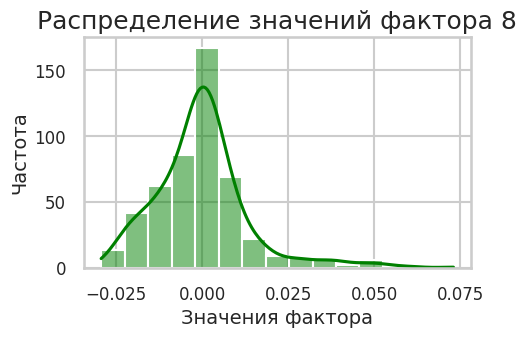

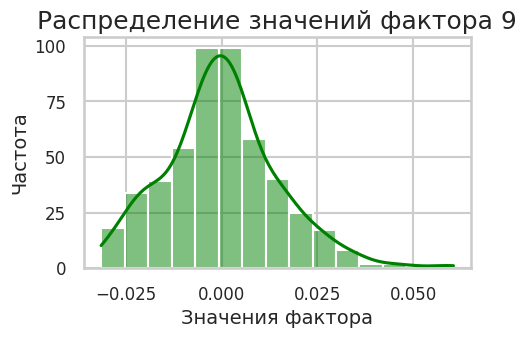

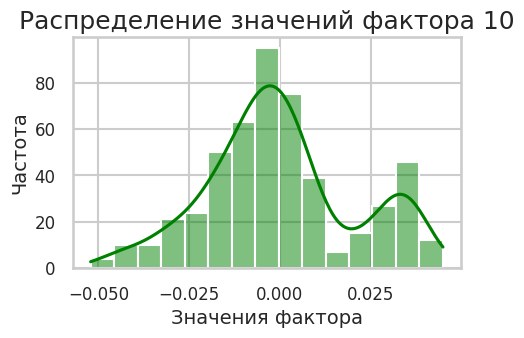

In [ ]:
modeler3.factors_plot()

### Топики


+
- **Рост продаж отечественных компьютеров**
- **ИТ компании: контакты и адреса (2)**
- Чистая прибыль/убыток компаний (2)
- ИИ и рынок ПК
- **Apple**
- **Игровая техника/ игры**
---
-
- Торговля
- Чистая прибыль/ убытки
- Бизнес в онлайне



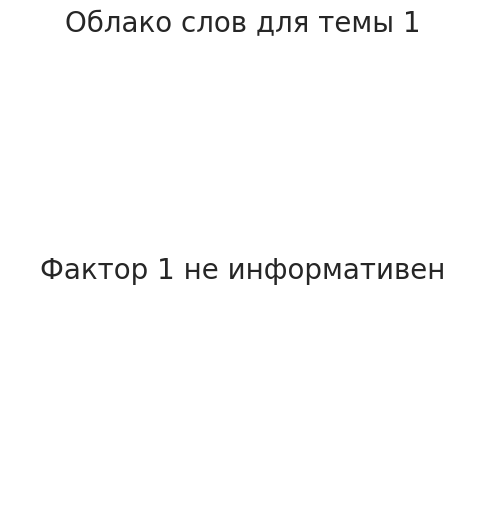

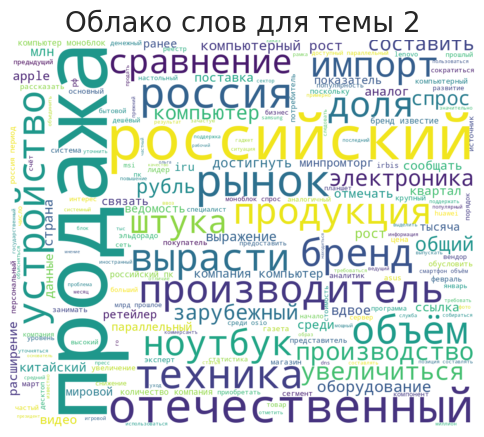

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 2  ##### 


Рынок российской компьютерной техники зафиксировал значительный скачок в прошлом году. Согласно данным от Ольги Доровской, занимающей пост вице-президента в OCS Distribution, продажи настольных компьютеров, рабочих станций и моноблоков в бизнес-сегменте подскочили на 71%, что составляет порядка 100 тысяч устройств. В течение года, производители из России выпустили на рынок около 500 тысяч портативных компьютеров. Большая часть продукции нашла своих покупателей среди государственных структур и частных компаний. В числе фронтменов продаж выделяются бренды DNS (DEXP), iRu, ICL, Depo, а также "Аквариус". По мнению Павла Фролова, основателя "Роббо", повышение интереса к отечественным компьютерам обусловлено ростом их качества, которое теперь не уступает зарубежным аналогам. Несмотря на это, точные объемы продаж по каждой из компаний остаются неизвестными, но известно, что в лидерах находится продукция от двадцати производителей. Этот рост подчер

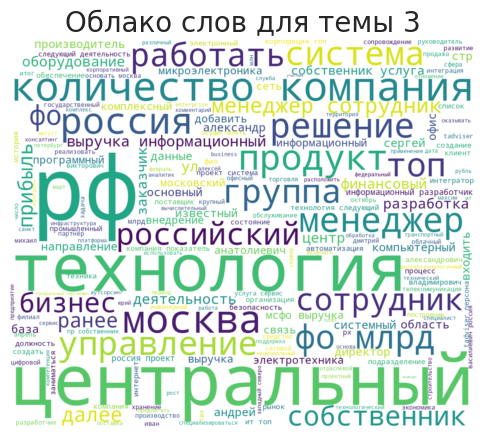

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 3  ##### 


Компания Информационные технологии Россия Центральный ФО РФ Москва 127015, Бутырская ул., 75 Топ-менеджеры: Сизоненко Григорий Евгеньевич Андреев Валерий Вадимович Коровин Иван Игоревич Державин Дмитрий Собственники: Сизоненко Григорий Евгеньевич Петрова Екатерина Александровна АО Информационная внедренческая компания (ИВК) - многопрофильная компания, основным родом деятельности которой является проектирование и поставка компьютерной техники. Компьютерная техника марки "ИВК" известна на ИТ-рынке РФ с 1993 г. С 1997 года ИВК является постоянным участником государственных конкурсов. За этот период заключены контракты на сумму более 5 млрд. руб. Направления деятельности Проектирование, производство, поставка компьютерной техники в офисном и промышленном исполнении. Системная интеграция. Комплексное решение по созданию и сопровождению информационных систем и систем жизнеобеспечения. Разработка автоматизированных систем, платформомообразующего п

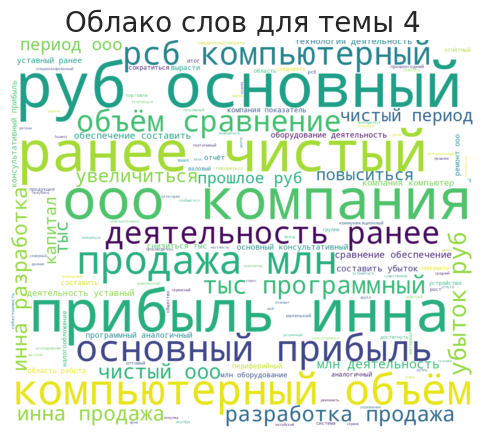

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 4  ##### 


Объем продаж новой компьютерной техники китайских производителей в Ростовской области за апрель - май 2024 года существенно вырос в сравнении с аналогичным периодом прошлого года. По некоторым категориям рост составил 52-60%, сообщается в исследовании компании Авито. Так, рост продаж новых планшетов Xiaomi в апреле-мае составил 60% при средней цене в 25 тыс. руб. Спрос на планшеты под брендом HUAWEI увеличился в этом году на 15%, покупка в мае такого устройства обходилась в 24 тыс. руб. Среди новых ноутбуков в 2024 году заметнее всего вырос спрос на HUAWEI. Так, продажи портативных компьютеров под данным брендом выросли на 52%. Самым популярным производителем компьютерной техники в регионе остается Apple. В частности, на него приходится 38% всех продаж планшетов. Средняя цена б/у устройств составила в мае 19 тыс. руб., новые планшеты покупали за 47 тыс. руб. На Apple приходится также 26% всех продаж ноутбуков. Средняя цена на б/у устройства

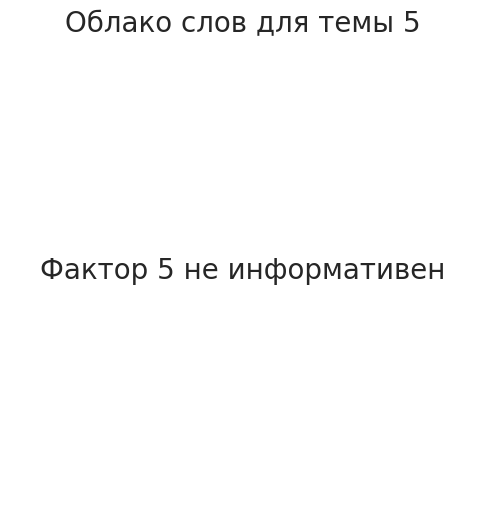

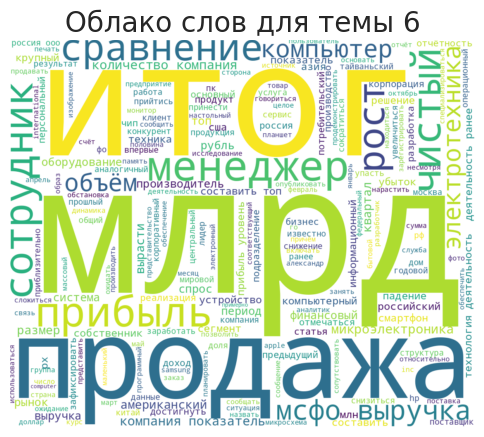

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 6  ##### 


Компания Электротехника и микроэлектроника С 1989 года Китай Азия Тайбэй Топ-менеджеры: Ху Самсон (Samson Hu) Выручка и прибыль по МСФО млрд NT$ Количество сотрудников компании 2008 г. 100000 300px Asustek Computer - тайваньский производитель компьютеров и комплектующих. Показатели деятельности 2022: Падение выручки на 1,4% до NT$493,47 млрд, прибыли - на 67% до NT$14,69 млрд По итогам 2022 года компания Asus получила выручку в размере NT$493,47 млрд (приблизительно $16,15 млрд по курсу на 20 марта 2023-го). Это на 1,4% меньше результата за предыдущий год, когда было получено NT$500,4 млрд. Соответствующие цифры приводятся в финансовом отчете, опубликованном 10 марта 2023 года. Чистая прибыль Asus в 2022-м составила NT$14,69 млрд (около $0,48 млрд). Для сравнения: годом ранее компания получила NT$44,55 млрд чистой прибыли. Таким образом, по данному показателю зафиксировано падение на 67%. В отчете отмечается, что в 2022 году в общем объеме 

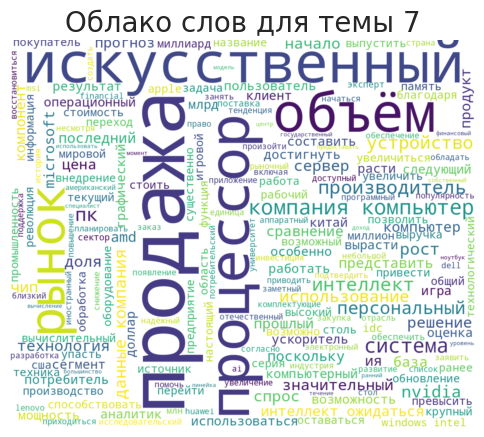

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 7  ##### 


По прогнозам исследовательской компании IDC, глобальные поставки персональных компьютеров в нынешнем году вырастут на 2%. Ожидается, что объем поставок ПК в 2024 году составит 265.4 млн устройств. Появление ПК с аппаратной поддержкой искусственного интеллекта приведет к росту спроса на компьютеры, и на горизонте до 2028 года рынок может постепенно вырасти до 292.2 млн устройств со средним ежегодным ростом продаж на 2.4%. Также эксперты прогнозируют начало цикла обновления компьютеров в 2025 году, что также будет способствовать постепенному росту продаж ПК. Наличие поддержки искусственного интеллекта не будет приводить к увеличению установленной базы ПК, но, как ожидается, может привести к росту средней стоимости проданных компьютеров. В общем объеме продаж ПК в этом году 119.3 млн устройств будут поставлены в потребительский сектор, 100.4 млн устройств попадут в коммерческий сегмент и 45.7 млн обеспечат поставки в госсектор. Владимир Ромашо

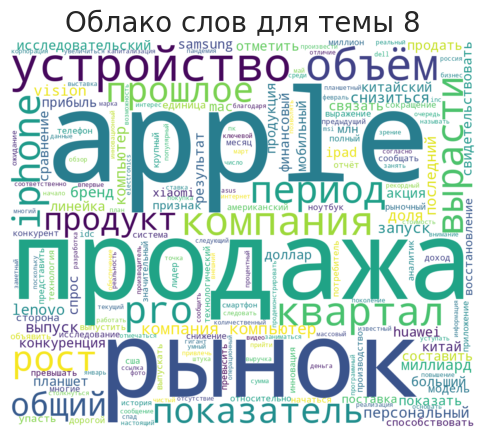

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 8  ##### 


Продажи планшетных компьютеров в мире в первом квартале 2024 года выросли на 0,5% относительно того же периода прошлого года - до 30,8 млн штук, по предварительным расчетам исследовательской компании IDC. Это первое повышение показателя почти за три года - со второго квартала 2021 года. Поставки планшетов американской Apple Inc. в январе-марте упали на 8,5% (до 9,9 млн единиц), поскольку компания была сосредоточена на распродаже запасов перед выпуском на рынок новых моделей во втором квартале. Тем не менее, Apple сохранила за собой лидерство в мире с долей в 32%. Продажи Samsung снизились на 5,8% (до 6,7 млн устройств), что было связано с усилением конкуренции со стороны других брендов и отсутствием новых моделей. Южнокорейская компания занимает на глобальном рынке долю в 21,7%. Между тем китайские Huawei, Lenovo и Xiaomi (SPB: 1810) увеличили реализацию своей продукции и долю в общемировом объеме продаж. "Рынок планшетов начал демонстриров

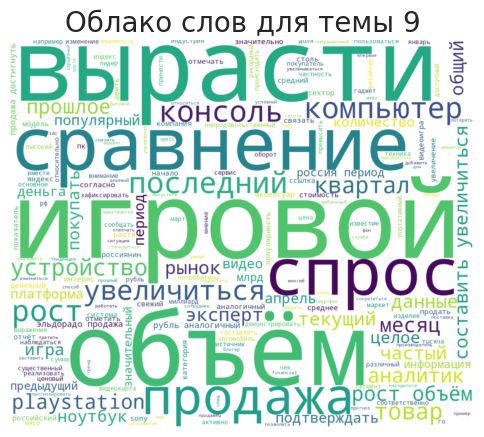

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 9  ##### 


Нынешний год может стать успешным для любителей и производителей видеоигр. Согласно последнему отчету, продажи игровых компьютеров в этом году увеличатся. Это же относится и к игровым мониторам. В 2023 году рынок компьютеров в целом и игровых компьютеров в частности находился на спаде. Продажи игровых ПК за год уменьшились на 13%. Игровые мониторы вместе с этим нарастили объем продаж на 20%. IDC считает, что в этом году ситуация будет лучше. Игровым компьютером на этот год прогнозируется скромный рост объем продаж на 1%. Объем поставок игровых мониторов может увеличиться на 13,6%. Популярность видеоигр растет, а вместе с ней растет и спрос на устройства для игр. Игровые мониторы дешевеют и покупателей на них находятся все больше. Мониторы с частотой не менее 165 Гц, временем отклика не более 1 мс и разрешением 1440p сейчас доступны как никогда прежде. Мониторы становятся дешевле, а стоимость игровых компьютеров и ноутбуков увеличивается. Ср

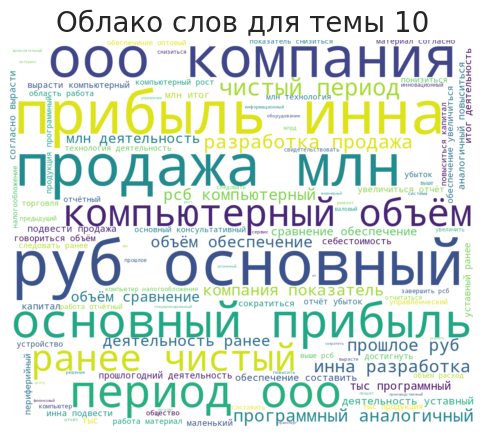

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 10  ##### 


ООО "ТЕХНОКОН" за 2023 год получило чистую прибыль по РСБУ в 3,23 млн. руб., что в 1,5 раза выше показателя за аналогичный период прошлого года. Объем продаж компании вырос на 36,35% до 7,96 млн. руб. Основным видом деятельности ООО "ТЕХНОКОН" (ИНН - 0277908970) является торговля оптовая компьютерами, периферийными устройствами к компьютерам и программным обеспечением.
------------------------------------------------------------
ООО "АРТАНТО" за 2022 год получило чистую прибыль по РСБУ в 357,00 тыс. руб., что в 5,76 раза выше показателя за аналогичный период прошлого года. Объем продаж сократился на 4,07% до 4,05 млн. руб. с 4,22 млн. руб. годом ранее. Основным видом деятельности ООО "АРТАНТО" (ИНН - 7843005608) является ремонт компьютеров и периферийного компьютерного оборудования.
------------------------------------------------------------
Объем продаж ООО "ИТ ДЛЯ ВСЕХ" за отчетный период увеличился в 1,5 раза до 113,42 млн. руб. с 75,4

In [ ]:
modeler3.print_topic(0.03, gpt=True, full=True, min_message_count=15)

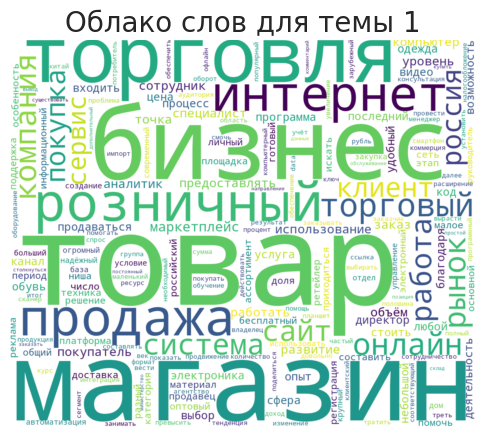

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 1  ##### 


Вадим Салимгареев: генеральный директор компании ЮТОН (инвестор, коуч и наставник, проработавший в бизнесе более 30 лет), поделился личным опытом работы на Wilberries и Ozon. Как изменился рынок за последние годы, какие тенденции стоит ожидать торговым компаниям = читайте в материале на сайте Информационного Агентства Новости России. Ни для кого не секрет, что доля интернет-торговли год от года увеличивается она растет и все больше заменяет оффлайн торговлю. На онлайн-сегмент пришлось 13,8% розничных продаж в РФ по итогам 2023 года против 11,6% годом ранее (ссылка). Процент замещения в разных нишах разный, больше всего в электронике до 28% и меньше всего пока в ритейле 8-10%. Я не зря говорю "пока", потому что этот процент во всех нишах пjстоянно растет. Как все начиналось? Мы помним, что первые интернет-магазины начали появляться в начале этого века, развитию интернет-магазинов сначала мешал медленный интернет, отсутствие смартфонов и дово

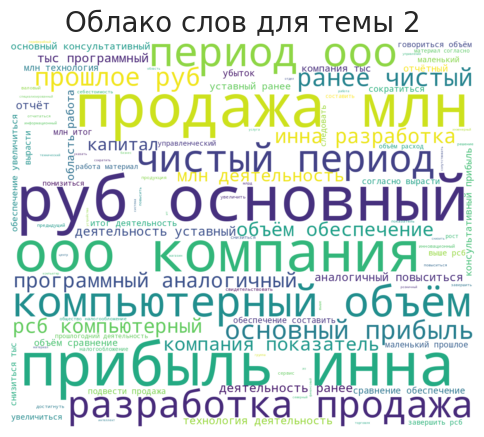

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 2  ##### 


ООО "ТЕХНИЧЕСКИЙ ОТДЕЛ" за 2022 год получило чистую прибыль в 605,00 тыс. руб., что на 45,5% меньше показателя за аналогичный период прошлого года. Компания "ТЕХНИЧЕСКИЙ ОТДЕЛ" по итогам за 2022 год снизила объем продаж на 1,21% до 5,40 млн. руб. с 5,46 млн. руб. за аналогичный период прошлого года. Основным видом деятельности ООО "ТЕХНИЧЕСКИЙ ОТДЕЛ" (ИНН - 7842488159) является деятельность консультативная и работы в области компьютерных технологий.
------------------------------------------------------------
ООО "КИТ" за 2022 год получило чистую прибыль в 160,00 тыс. руб., что в 5,06 раза меньше показателя за аналогичный период прошлого года. Объем продаж компании за отчетный период понизился в 4,41 раза до 1,49 млн. руб. с 6,57 млн. руб. за аналогичный период прошлого года. Основным видом деятельности ООО "КИТ" (ИНН - 9731056703) является разработка компьютерного программного обеспечения.
--------------------------------------------------

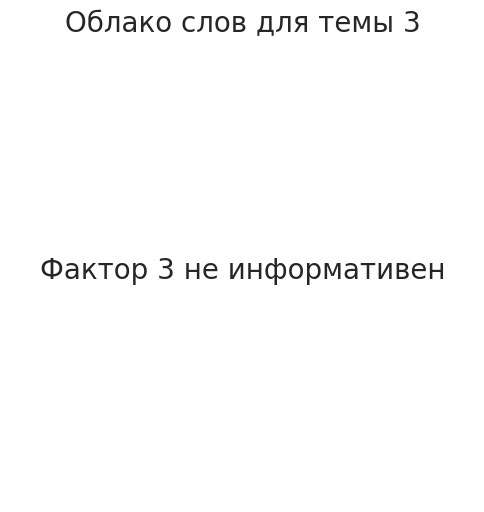

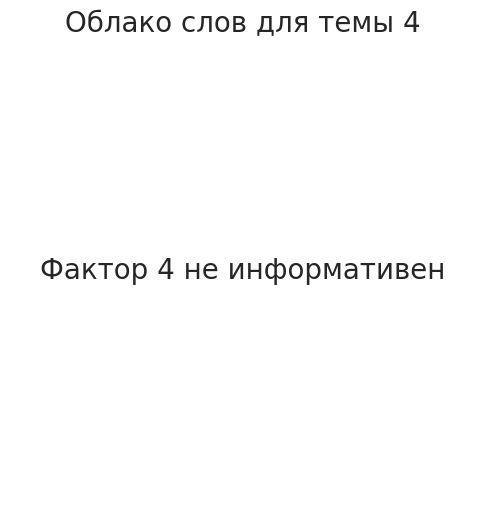

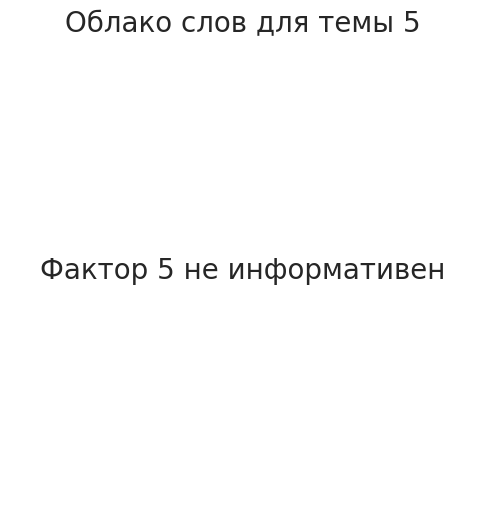

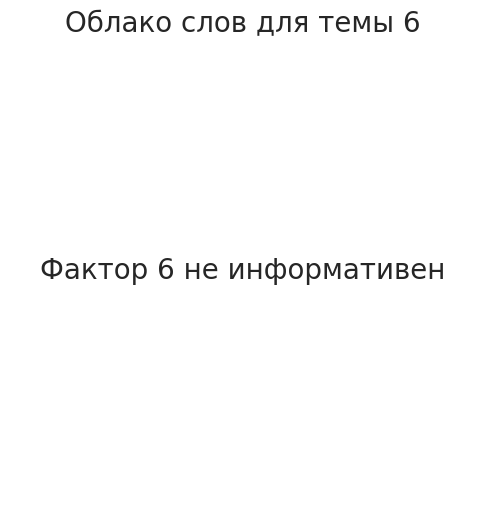

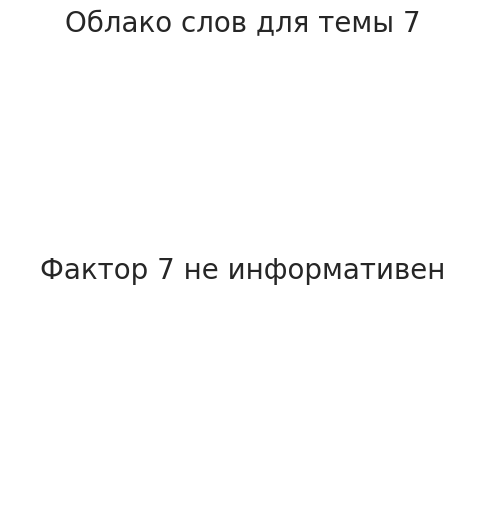

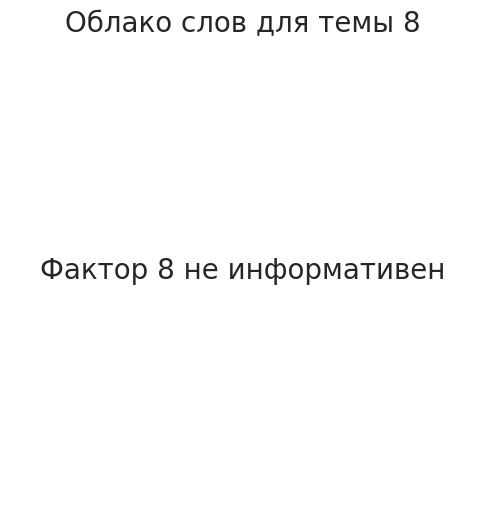

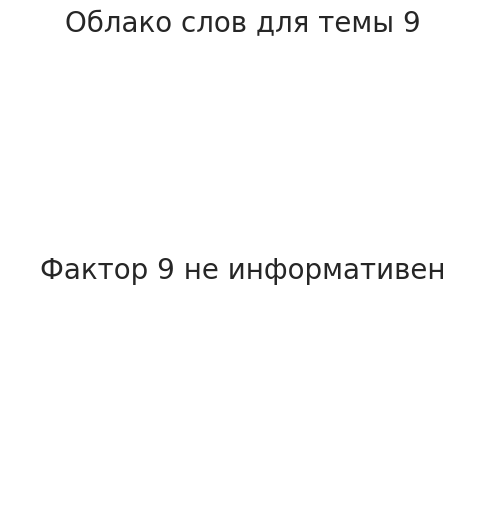

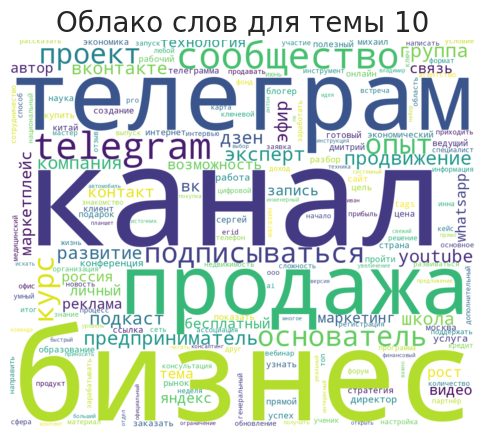

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 10  ##### 


Контакты Ивана: +79058079653 Говорят, если написать ему в телеграм, он отправляет супер полезный файл с четкой инструкцией, как начать продавать на маркетплейсах, с контактами проверенных специалистов и полезными ссылками.
------------------------------------------------------------
Подводим IT-итоги недели в подкасте Telegram-канала ForGeeks. Рассказал об обновлении GPT, первом планшете HMD, ужесточении проверок для покупки SIM-карт и многое другое. Слушайте свежий выпуск, читайте и подписывайтесь на ForGeeks в Telegram. Кстати, мы есть и в YouTube!
------------------------------------------------------------
Бизнес, который изменит твою жизнь. - все процессы в сообществе ВК - Готовые бизнесы на выбор. Оферта - Чат-Блог Рабочий what's app - 8 919 637 51 57 с 10 до 18 00 МСК
------------------------------------------------------------
Вопросы про IT курсы сюда: или programmer_kurs@mail.ru Мой Boosty-канал про системное мышление, науку, обр

In [ ]:
modeler3.print_topic(-0.03, sign='-', gpt=True, full=True, min_message_count=10)

# Объединенный датасет

## Исследование

In [ ]:
df_ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/computers.csv', sep=';', on_bad_lines='skip')

In [ ]:
df__ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/comps2.csv', sep=';', on_bad_lines='skip')

In [ ]:
df_combined = pd.concat([df_, df__], ignore_index=True)

In [ ]:
preprocessed__ = pd.read_csv('/content/drive/MyDrive/Совкомбанк/Comps/modified4.csv')

In [ ]:
modeler4 = TopicModeler(df_combined['Сообщение'].to_frame(), sw_, preprocessed__)

In [ ]:
%%time
modeler4.drop_similar_messages(1.5)

Количество текстов: 11655

Количество текстов без полных дубликатов: 8965

Количество текстов после удаления похожих: 5070

CPU times: user 3min 34s, sys: 1.3 s, total: 3min 35s
Wall time: 3min 36s


In [ ]:
#modeler4.initial_preprocessed.to_csv('/content/drive/MyDrive/Совкомбанк/Comps/modified4.csv', index=False)

In [ ]:
modeler4.clustered_df.value_counts('cluster')

cluster
3824    39
2517    32
6       28
1875    20
740     17
        ..
2187     1
2188     1
2189     1
2190     1
2824     1
Name: count, Length: 5070, dtype: int64

In [ ]:
modeler4.clustered_df[modeler4.clustered_df['cluster']==3824]['Сообщение']

265     =Носталгия= Дело в том, что у меня не получает...
483     Дело в том, что у меня не получается жить в эт...
523     НОСТАЛЬГИЯ Дело в том, что у меня не получаетс...
840     Дело в том, что у меня не получается жить в эт...
939     Дело в том, что у меня не получается жить в эт...
1144    …есть над чем задуматься… Еще не так давно мы ...
1452    Эдуардо Галеано — уругвайский писатель и полит...
1762    Скопировано Прочитано И в действительности так...
2256    Еще не так давно мы с женой стирали пеленки де...
2273    Дело в том, что у меня не получается жить в эт...
2288    О больном вопросе?:) Выбрасывать или нет? Ремо...
2902    Эдуардо Галеано Дело в том, что у меня не полу...
3990    МУДРОСТЬ ДНЯ Мы живём в мире, где похороны важ...
4106    МИР ЯВНО УВЛЁКСЯ ИМИТАЦИЕЙ ЛИЧНОГО УСПЕХА ВМЕС...
4190    Еще не так давно мы с женой стирали пеленки де...
4216    Еще не так давно мы с женой стирали пеленки де...
4334    Мы живём в мире, где похороны важнее покойника...
4451    Эдуард

Создание эмбеддингов, добавление в базу...


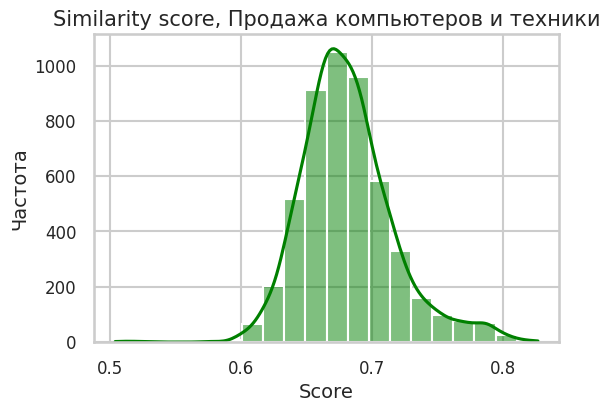

In [ ]:
modeler4.faiss_query('Продажа компьютеров и техники', plot=True, reinit_db=True)

In [ ]:
modeler4.get_most_relevant(0.12)

Количество релевантных текстов: 609



In [ ]:
modeler4.for_analysis

,Сообщение
0,Сборка ПК - продажа компьютеров Сборка ПК - ка...
1,Оценка: 5 из 5 Считается одним из крупных мага...
2,В эпоху стремительного технологического прогре...
3,Техника в каждый дом: россияне стали чаще поку...
4,Доля продаж компьютеров отечественного произво...
...,...
604,"Прибежали в гости к знакомым, чтоб взять кирку..."
605,ССЫЛКА НА САЙТ: КОНТАКТ ДЛЯ СВЯЗИ: 1AVALONKZ@g...
606,Поддержка канала: Подписыайся на мой Яндекс.Дз...
607,Как сбросить Windows до заводских настроек с у...


In [ ]:
%%time
modeler4.vectorize_text(reinit=True)

Предобработка текстов...

Всего уникальных слов: 7655
 Из них берем максимум 25.0 процентов
TF-IDF...
CPU times: user 1min 24s, sys: 5.19 s, total: 1min 29s
Wall time: 1min 32s


In [ ]:
modeler4.perform_pca(15, kernel_type='sigmoid')

In [ ]:
#modeler4.embs_and_text

In [ ]:
#modeler4.scree_plot()

In [ ]:
#modeler4.factors_plot()

### Топики


+
- **Рост популярности кустарной сборки ПК**
- **Рост продаж отечественных компьютеров**
- *Где купить ноутбук + обзоры*
- *Реклама*
-**Apple**
- **ИТ компании: контакты и адреса**
- *Оценки магазинов*
- ***Мошенничество***
---
-
- **Восстановление рынка компьютеров после спада**
- *ПК и комплектующие*
- **Игровая техника/ игры**
- *Онлайн-торговля*




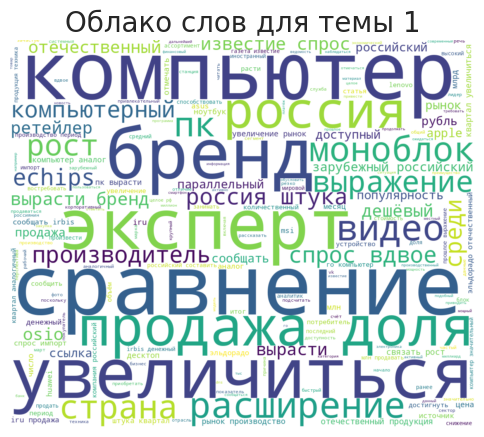

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 1  ##### 


Доля продаж компьютеров отечественного производства увеличилась до 20%. Статья Продажи компьютеров российских брендов увеличились вдвое m.vk.com
------------------------------------------------------------
КОМПЬЮТЕРЫ В СТРАНЕ В России вдвое увеличилась доля продаж отечественных компьютеров. В I квартале 2024-го по сравнению с аналогичным периодом прошлого года спрос на компьютеры (лэптопы, десктопы и моноблоки) в России вырос в натуральном выражении на 44%, до 1,3 млн штук.
------------------------------------------------------------
31 марта - Krym.News. В России продажи отечественных компьютеров стремительно растут, и каждый пятый проданный компьютер в стране является российского производства, сообщают ритейлеры. Рост спроса на российские ПК способствует увеличению их доли на рынке, которая за год выросла до 20% Эксперты отмечают, что отечественные компьютеры часто продаются на 5-15% дешевле зарубежных аналогов, что также способствует пов

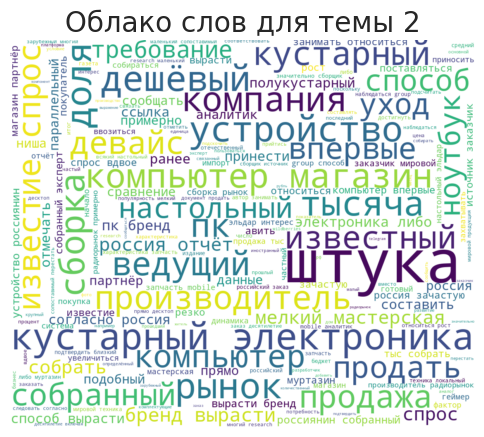

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 2  ##### 


В 2023 году 20% настольных ПК, проданных в России, не относились к какому-либо бренду - то есть были собраны кустарным или полукустарным способом прямо в магазине или на радиорынке согласно требованиям заказчика (зачастую - из принесенных им запчастей). В 2022-м такие устройства занимали всего 11% рынка, следует из отчета компании-партнера нескольких производителей электроники. Об этом пишет газета "Известия". При этом продажи таких девайсов за год выросли более чем в два раза - примерно до 260 тыс. штук, подсчитали авторы документа. Эти данные подтвердил источник, близкий к одному из импортеров техники. "Поскольку настольные компьютеры ведущих мировых брендов перестали поставляться в Россию - во всяком случае, по параллельному их ввозится значительно меньше, чем ноутбуков, нишу захватывают локальные сборщики. При этом такое устройство при сопоставимых характеристиках может оказаться дешевле, чем десктоп известного бренда", - сказал ведущий

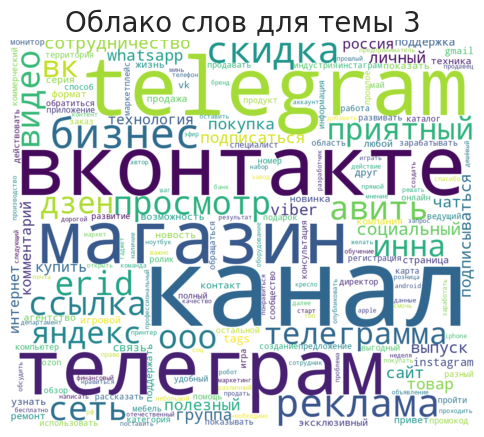

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 3  ##### 


Купить можно на *Али - Телеграм - ВК - Дзен - Boosty - = *Реклама: ООО "АЛИБАБА.КОМ (РУ)" ИНН 7703380158
------------------------------------------------------------
- Зарабатывай в Интернете с моей командой: - Регистрация карты покупок на скидку от 20% и подарками: Я на связи: Telegram-Viber-WhatsApp +375292600529 Давайте дружить в социальных сетях: скайп: olga-faberlic Я в ВКОНТАКТЕ: Я в Фейсбук Я в ОДНОКЛАССНИКАХ: Я в ИНСТАГРАМ Делюсь своей жизнью на каналах Telegram: Обучаю созданию бизнеса в Интернете через Личный бренд. Мой номер наставника - 701061142 Каждую неделю 2-3 новых видео. Подпишись на мой канал -
------------------------------------------------------------
Покупай в магазине Vsemayki по ссылке Используй промокод на скидку 10% LYUBA624 Реклама. ООО "Всемаркет", ИНН 5406807316. erid 2VtzqxdPfUj ПОЛЕЗНЫЕ ССЫЛКИ Мой Бусти: Мой телеграм-канал: Для связи с общественностью: lyuminor123@gmail.com ПОДДЕРЖАТЬ КАНАЛ Сбербанк: 9112 388

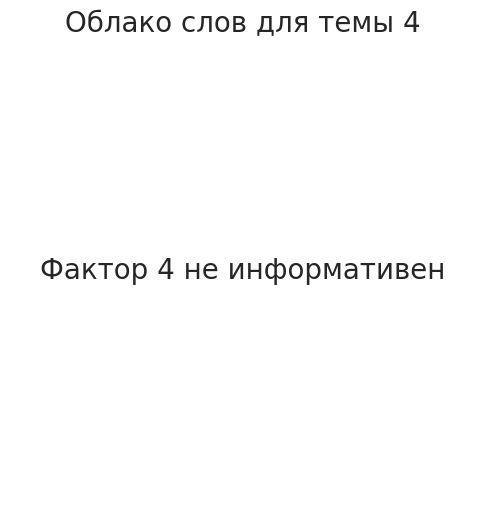

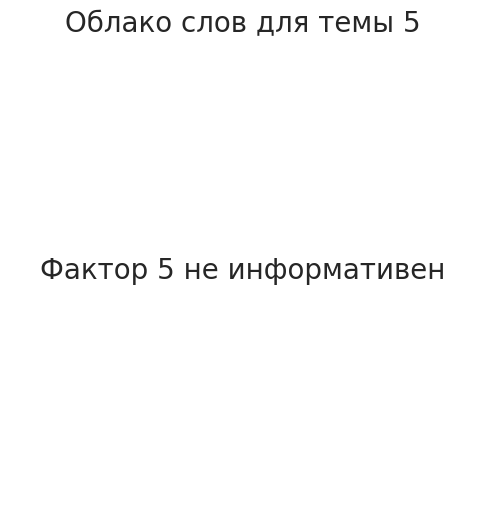

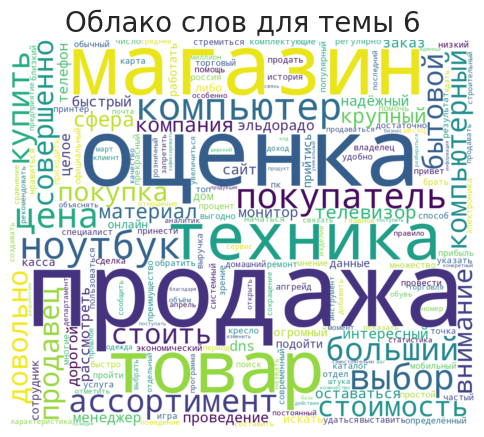

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 6  ##### 


Многие люди стремятся регулярно обновлять свои компьютеры и ноутбуки. Однако, что делать со старой техникой? Выбрасывать ее совершенно нерационально с экономической точки зрения. К счастью, существует множество способов продать подержанную электронику и получить за нее достойную компенсацию. И сегодня мы рассмотрим топ-5 мест, где можно выгодно продать б/у компьютеры и ноутбуки в 2024 году. Комиссионные магазины Они уже давно зарекомендовали себя как довольно надежные посредники между продавцами и покупателями подержанных товаров. В 2024 году эти торговые точки не теряют своей актуальности и в сфере продажи электроники. Преимущество комиссионных магазинов заключается в том, что они берут на себя все хлопоты по поиску покупателя и проведению сделки. Владельцу техники достаточно лишь принести свой компьютер или ноутбук в магазин, где специалисты проведут оценку и выставят товар на продажу. Но стоит учитывать, что комиссионные магазины берут о

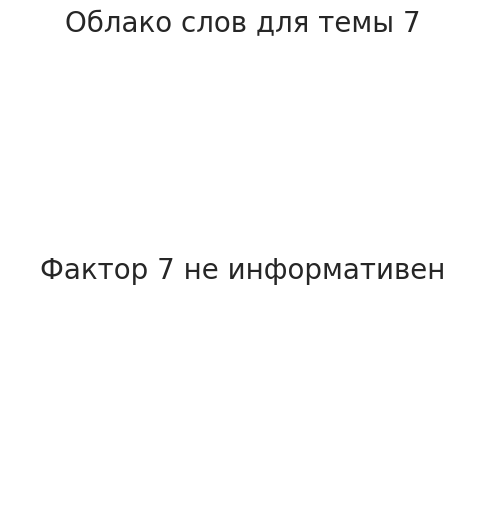

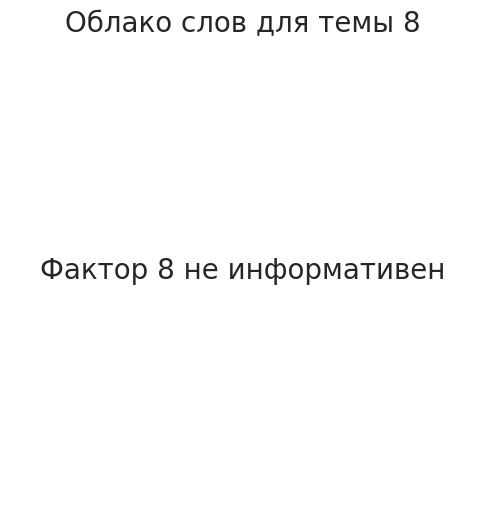

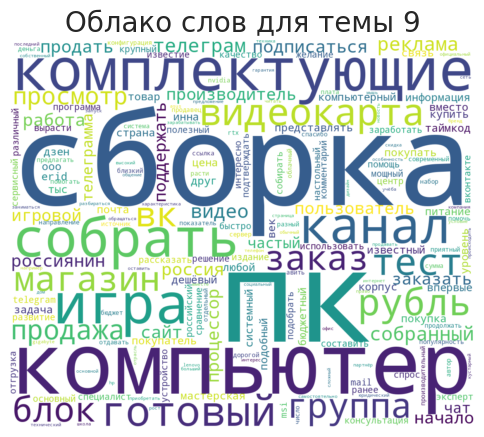

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 9  ##### 


Сборка ПК - продажа компьютеров Сборка ПК - как продать ПК?
------------------------------------------------------------
Россияне вернулись в 90-е. В стране расцвет самостоятельной сборки ПК, готовые компьютеры никому не нужны Россияне проявили недюжинный интерес к компьютерам самостоятельной сборки. Они больше не хотят покупать готовые конфигурации. Рост продаж самосборных ПК гигантский – подобное происходит впервые за последние 25 лет. Не на все готовенькое Российские пользователи стали намного чаще отдавать предпочтение самостоятельной сборке настольных ПК вместо покупки уже готовых решений, в том числе и от известных производителей. Продажи компьютеров, которые были собраны непосредственно в магазинах или даже в ближайшем сервисном центре идут в гору по всей стране, и это новое для нее явление – с начала XXI века отгрузки росли только у готовых сборок. По информации «Известий», самосборные компьютеры составили 20% от всех проданных «маш

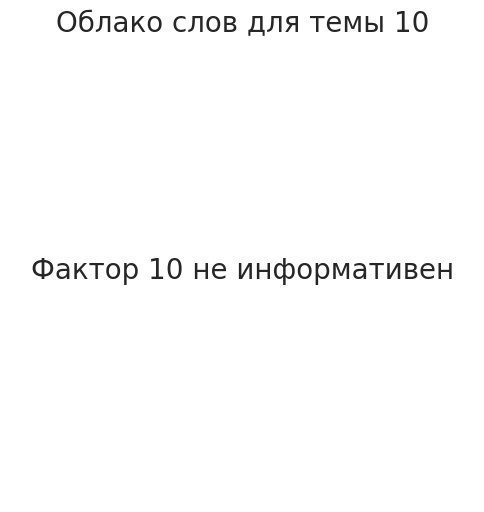

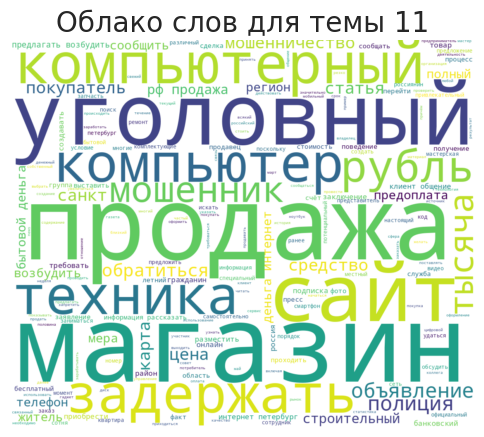

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 11  ##### 


В Севастополе 20-летний парень сдал в мастерскую по ремонту компьютерной техники свой неисправный телефон стоимостью почти 20 тысяч рублей. Спустя несколько дней он пришел за смартфоном, но ИП, который взялся за починку гаджета, сообщил, что необходимо подождать еще несколько дней, поскольку нет нужных комплектующих. Когда история с поиском запчастей затянулась еще на несколько недель, владелец телефона начал искать их самостоятельно, и в процессе поиска случайно наткнулся на объявление о продаже похожего смартфона в одном из ломбардов. Заподозрив неладное, он направился в комиссионный магазин и убедился, что выставленный на витрине ломбарда телефон именно тот, который он сдавал в ремонт. После этого молодой человек обратился в полицию. Полиции удалось задержать подозреваемого в преступлении. Против него возбуждено уголовное дело по статье о присвоении или растрате и "светит" до пяти лет лишения свободы, сообщает пресс-служба УМВД России п

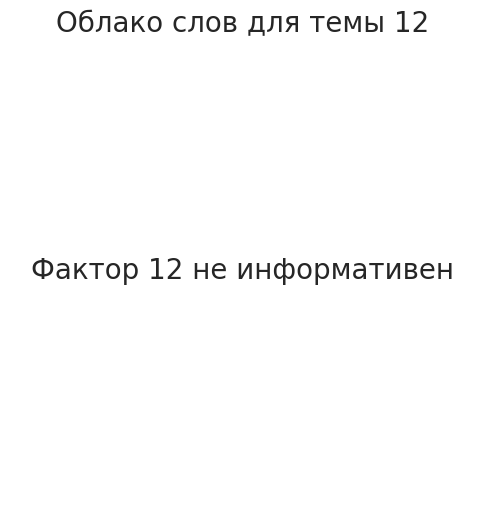

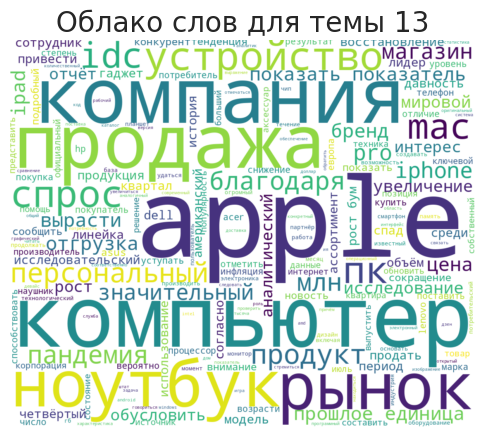

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 13  ##### 


Поиск проверенных оригинальных товаров от бренда Apple может занять большое количество времени. Но нет необходимости посещать десятки офлайн магазинов, чтобы найти нужный девайс. Интернет-магазин Технократ станет местом, где можно купить разнообразные гаджеты от компании из Купертино по привлекательной цене. Ассортимент товаров Среди внушительного числа позиций в каталоге Технократ можно выделить iPhone, iPad, MacBook pro, iMac, Mac mini, Apple Watch. Продукция представлена как новенькими моделями, так и не теряющими популярности девайсами. Но все они находятся в идеальном состоянии и подойдут для эффективного решения рабочих задач. На какие продукты обратить внимание Традиционно наибольшее внимание привлекают Айфоны различных версий, в том числе выпущенные в 2023-м году iPhone 15, 15 Pro и Pro Max. Так же в каталоге представлены МакБуки, iMac и другие версии персональных компьютеров, которые можно адаптировать под конкретные потребности з

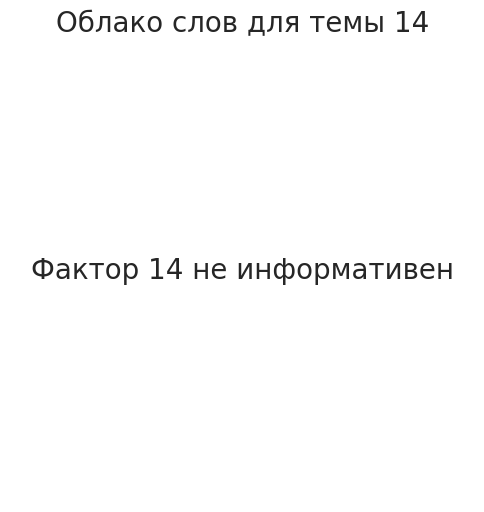

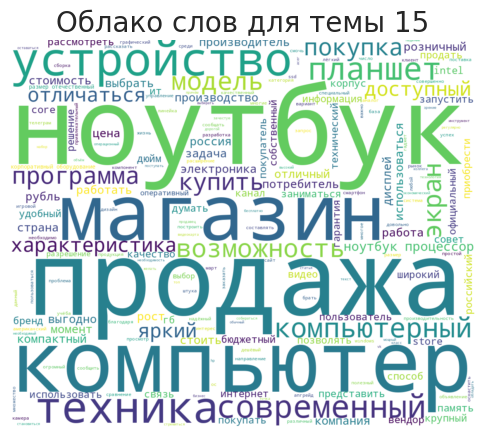

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 15  ##### 


💡 3 способа сэкономить на покупке ноутбука (и другой компьютерной техники) 💻💰 Определите, для чего вам нужен ноутбук/компьютер 🤔 Чтобы не переплачивать, важно четко определить, для каких задач вы собираетесь использовать устройство. Если вам нужен ноутбук для простых задач, таких как набор текста и просмотр фильмов, не стоит покупать дорогую игровую модель с мощной видеокартой. Рассмотрите более простые модели с хорошим экраном. Выбирайте характеристики, которые действительно будут использоваться. Рассмотрите модели ноутбуков после лизинга 💼💸 Отличный и малоизвестный способ сэкономить – купить ноутбук после лизинга. Это дает возможность приобрести устройство бизнес-класса по цене обычного. Крупные компании берут технику в лизинг и через некоторое время передают её компаниям, которые занимаются пост-лизингом. Эти компании удаляют всю информацию, обслуживают и тестируют технику, а при необходимости ремонтируют. После этого ноутбуки поступают

In [ ]:
modeler4.print_topic(0.025, gpt=True, full=True, min_message_count=15, share=0.5)

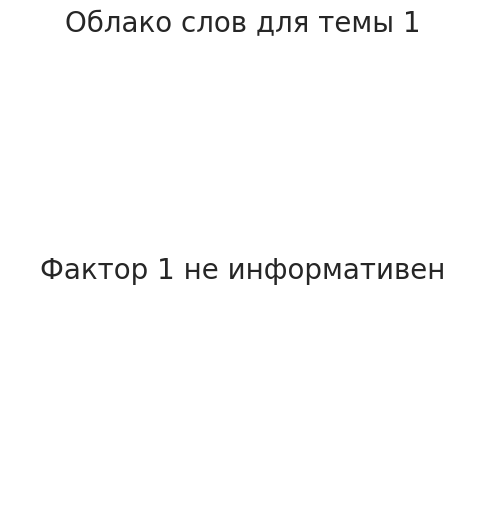

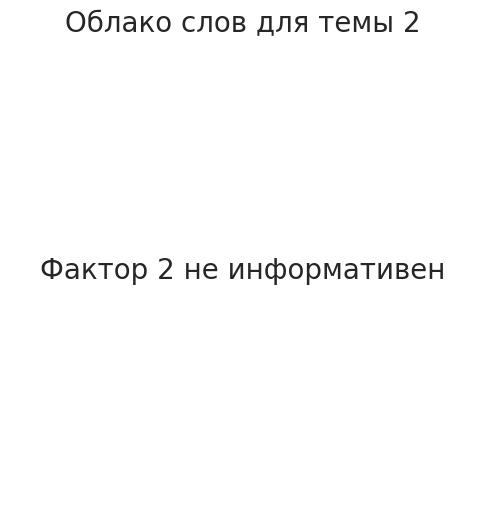

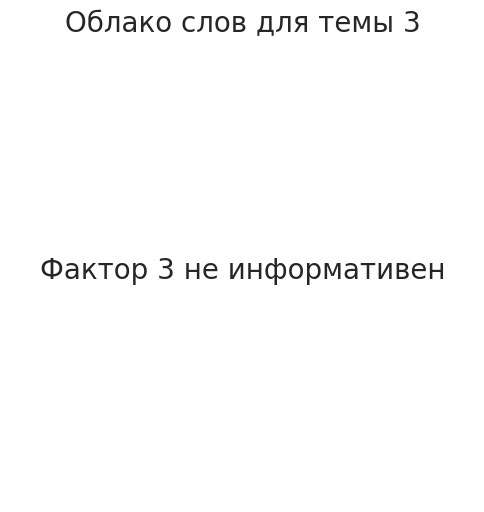

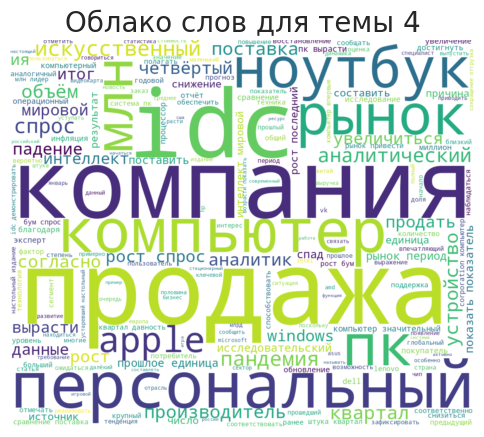

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 4  ##### 


Рынок ПК снова на подъеме Согласно аналитическому изданию IDC, мировой рынок компьютеров начал демонстрировать рост продаж после двухлетней рецессии. За прошедший год (2024) было продано 57,2 миллиона настольных ПК и 45,1 миллиона ноутбуков, что соответствует увеличению на 3,2% и 4,2% соответственно по сравнению с предыдущими годами. Вопреки не самому впечатляющему росту, наблюдается тенденция к увеличению спроса на компьютеры, которая, вероятно, будет усиливаться со временем. Одной из ключевых причин роста продаж является потребность пользователей в обновлении устаревших устройств. Многие из них не соответствуют требованиям новых операционных систем, таких как Windows 11, и не обладают достаточными мощностями для работы с современными технологиями, включая искусственный интеллект. Также причиной роста называют расцвет искусственного интеллекта. Покупатели все более интересуются возможностями ИИ, а производители активно интегрируют специали

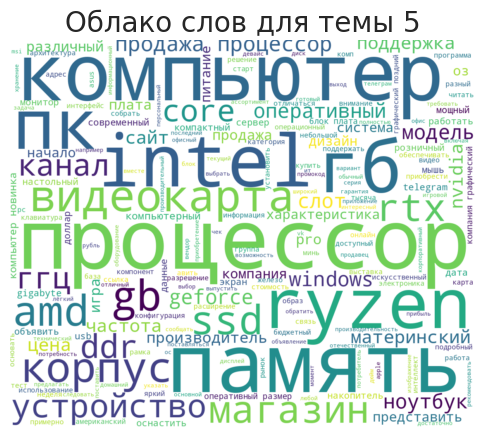

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 5  ##### 


Игровой пк Ryzen 5/Rtx 3060 ti: объявление о продаже в Костроме на Авито. Мощный и надёжный игровой компьютер в отличном состоянии и не требующий обслуживания Почти все железо новое, с чеками, гарантиями и коробками, все на пломбах Собирался не из самого дешевого, как это часто можно встретить в магазинах или авито, а с упором на надёжность и про внешний вид не забыл Тесты на скриншоте прилагаю Установлена Windows 10 Pro Мышь и клавиатура в комплекте Процессор - Ryzen 5 5600 Кулер Frozn a620 black Материнская плата - MSI B550 GAMING PLUS Видеокарта MSI RTX 3060 Ti Gaming X TRIO на памяти Samsu... Игровой пк Ryzen 5/Rtx 3060 ti купить в Костроме | Электроника | Авито Игровой пк Ryzen 5 5600/Rtx 3060 ti Подробнее на моем аккаунте Avito:
------------------------------------------------------------
Компания Ayaneo пополнила ассортимент компактных ПК моделью AM01S, которая выделяется своим ретро-дизайном в стиле компьютеров Apple Macintosh. Нови

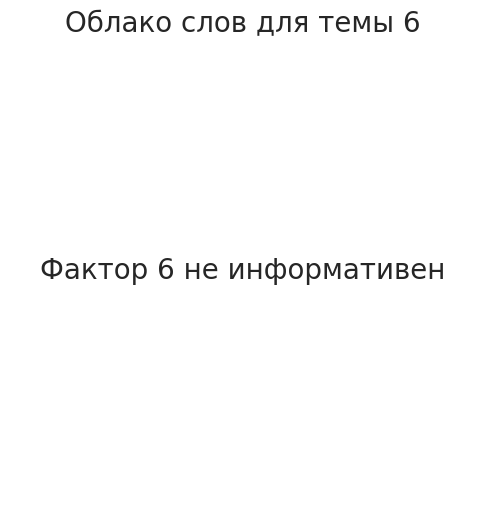

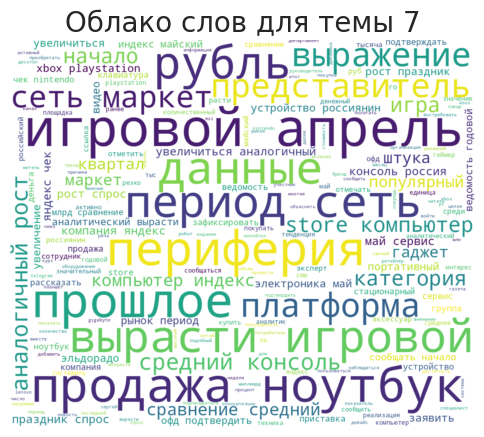

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 7  ##### 


Россияне запаслись игровыми гаджетами на майские праздники. В апреле и начале мая продажи игровых ноутбуков выросли в штуках на 60% по сравнению с аналогичным периодом 2023 г., рассказал представитель «Яндекс маркета». В тот же период в сети re:Store продажи компьютеров, ноутбуков и игровой периферии выросли на 12%, подтвердил тенденцию представитель этой компании. Рост спроса на такую категорию устройств на 31% в годовом выражении подтвердил и представитель аналитического сервиса «Чек индекс» компании «Платформа ОФД». Взлетели продажи и игровых консолей: спрос вырос на 51%, а средний чек увеличился на 12% до 25 050 руб. Спрос на игровые гаджеты и электронику для развлечений вырос на 12–60%
------------------------------------------------------------
В апреле и начале мая россияне начали куда активнее покупать игровую электронику и периферию. Об этом сообщают "Ведомости" со ссылкой на нескольких ритейлеров. © Чемпионат.com Так, продажи игро

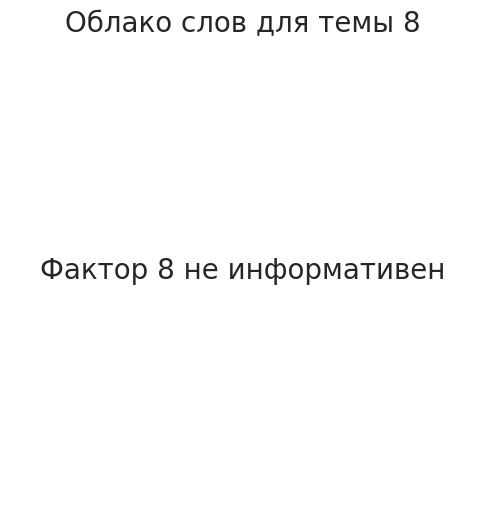

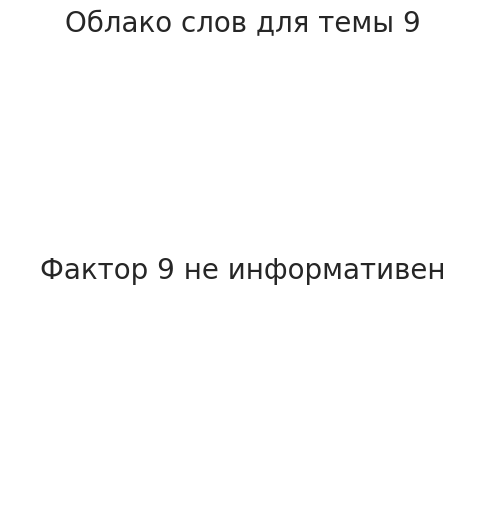

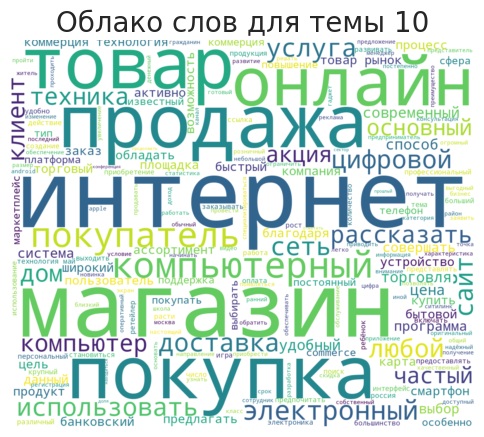

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 10  ##### 


№38 (6242) от 24 мая 2024 Школьникам рассказали об интернет-торговле В рязанской школе № 76 прошел "Урок цифры", направленный на повышение компьютерной грамотности подрастающего поколения. Такие акции проводятся регулярно при поддержке АНО "Цифровой регион". В этот раз темой занятия стала современная интернет-торговля. Урок для старшеклассников провел известный в профессиональных кругах практик интернет-магазинов и ментор Алексей Свирюков. Он рассказал об основных принципах устройства продажи товаров и услуг через интернет, разнообразных приемах повышения продаж и подводных камнях, с которыми может столкнуться как пользователь, так и бизнесмен, работающий в этой сфере. - Существует множество приемов, технологий и терминов из мира интернет-торговли, о которых мало кто слышал. К примеру, я и мои коллеги оперируем понятиями "красного" и "синего" океанов. Это характеристика степени перегретости того или иного специального рынка. Выбирать, разу

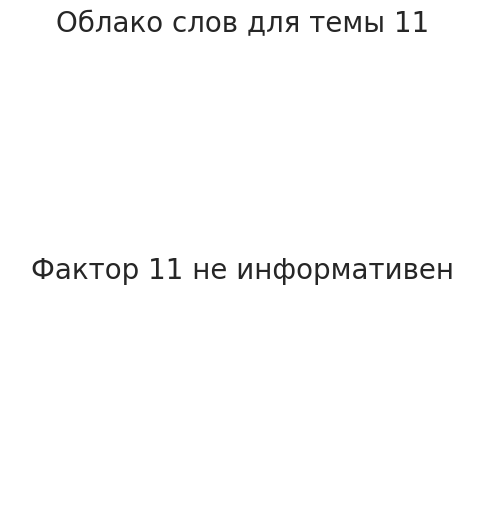

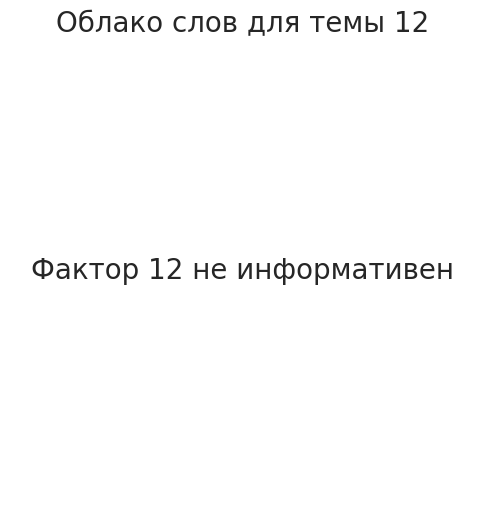

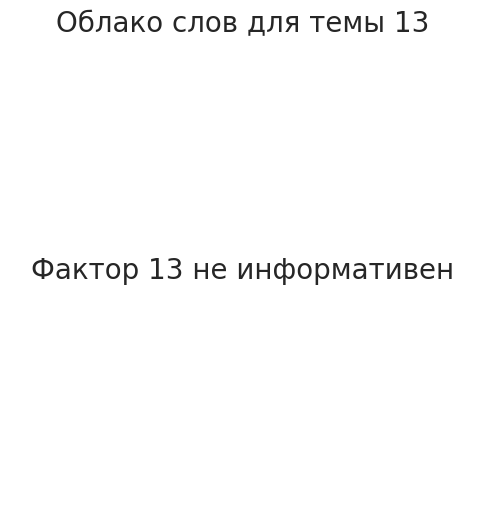

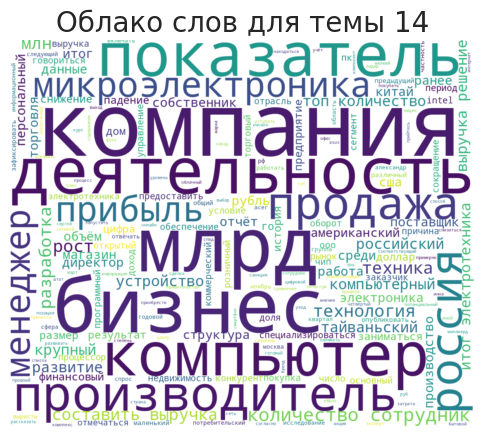

##### КЛЮЧЕВЫЕ СООБЩЕНИЯ ДЛЯ ТЕМЫ 14  ##### 


Компания Электротехника и микроэлектроника С 1968 года Россия США Санта-Клара Топ-менеджеры: Гелсингер Пэт (Pat Gelsinger) Фишер Даг Раттнер Джастин Эден Муди Собственники: Почти 100% акций компании находится в свободном обращении на фондовых биржах. Содержание Структура и управление Показатели деятельности 2023: В списке компаний с крупнейшими затратами на НИОКР 2022 Доля доходов от бизнеса в Китае - 27% Сокращение продаж на 20% до $63,1 млрд Бизнес в России Слияния и поглощения Сотрудники и работа в Intel Центры разработок Процессоры 2023 Intel заплатит €376 млн за подкуп производителей ПК Правительство Германии предоставило Intel субсидии на 10 млрд евро для строительства завода на Востоке страны План строительства завода в Израиле План строительства завода в Польше за $4,9 млрд 2022 Intel заплатит $950 млн за кражу технологий для своих процессоров Демонстрация Wi-Fi 7 совместно с Broadcom Отмена неуплаченного штрафа в €1,06 млрд Строит

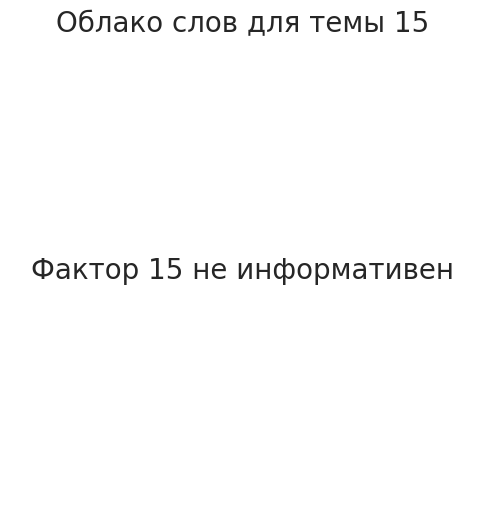




****************************** ИТОГ ****************************** 

Количество классифицированных сообщений:  123 

Количество сообщений для темы 1: 0
Количество сообщений для темы 2: 0
Количество сообщений для темы 3: 0
Количество сообщений для темы 4: 37
Количество сообщений для темы 5: 32
Количество сообщений для темы 6: 0
Количество сообщений для темы 7: 16
Количество сообщений для темы 8: 0
Количество сообщений для темы 9: 0
Количество сообщений для темы 10: 24
Количество сообщений для темы 11: 0
Количество сообщений для темы 12: 0
Количество сообщений для темы 13: 0
Количество сообщений для темы 14: 14
Количество сообщений для темы 15: 0


In [ ]:
modeler4.print_topic(-0.025, sign='-', gpt=True, full=True, min_message_count=10, share=0.5)